## Post-Fire Structural Damage Assessment Using Satellite Imagery and Deep Learning
### 2025 Los Angeles Palisades and Eaton Fires

**Group Members:** Tess Vu, Luciano Lu, Ming Cao

**Submission Date:** April 2025

---

## Problem Definition & Technical Justification

The January 2025 Los Angeles wildfires destroyed thousands of structures across the Pacific Palisades and Altadena communities, requiring rapid damage assessment to guide emergency response and long-term recovery planning. Traditional post-fire damage inspection relies on CAL FIRE Damage Inspection (DINS) field teams who physically visit each structure, a process that takes weeks to complete and places inspectors in hazardous conditions. This project builds a machine learning pipeline that uses freely available Sentinel-2 satellite imagery to predict which structures sustained damage, producing a binary damage mask at 20-meter resolution over the fire-affected area. The target users are emergency management agencies and municipal planning departments who need spatially explicit damage estimates faster than field inspection can deliver.

This project solves a binary semantic segmentation task where given a multi-channel raster stack over a fire-affected region, classifies each 20m pixel as damaged or intact. The model learns the spectral and topographic signatures that distinguish fire-damaged areas from undamaged surroundings, with the core spectral signal being the delta Normalized Burn Ratio (dNBR), which measures the change in vegetation and moisture content between pre-fire and post-fire imagery using the near-infrared (NIR, Band 8A) and shortwave infrared (SWIR, Band 12) wavelengths. Severely burned areas exhibit a strong dNBR signal because fire consumes vegetation canopy and reduces surface moisture, altering reflectance in these bands. Additional raw spectral bands (pre-fire and post-fire NIR and SWIR) are included as features alongside dNBR so the model can learn non-linear spectral relationships that a single-index threshold might miss. DEM-derived aspect captures slope orientation, which influences fire spread behavior and exposure patterns in mountainous terrain like the Santa Monica Mountains and San Gabriel foothills. Rasterized building footprints from the Microsoft Open Buildings dataset provide structural context, helping the model distinguish vegetated burn scars from actual structural damage within the built environment.

Three failure modes were anticipated during the proposal phase. First, topographic shadowing on north-facing slopes can suppress post-fire reflectance, causing the dNBR to overestimate burn severity. The DEM aspect channel was included specifically to help the model learn this confounding issue, DEM slope was specifically left out due to the model implicitly learning that infrastrucutre is built on flatter surfaces, inflating the accuracy. Second, unburned vegetation islands within the fire perimeter could be misclassified as damaged if the model relies too heavily on spatial proximity to the burn scar rather than the spectral signal. Spatial block cross-validation addresses this by ensuring the model generalizes across spatially disjointed regions rather than memorizing local patterns. Third, the severe class imbalance (damaged pixels represent roughly 5.8% of the study area within the fire perimeter) was expected to bias the model toward predicting the majority intact class. This was addressed through a combined loss function pairing Dice loss with Binary Focal Cross-Entropy (`alpha = 0.80`, `gamma = 3.0`), which heavily penalizes false negatives on the minority damaged class.

An additional failure mode emerged that was not anticipated in practice, which was target leakage. An earlier version of the ground truth label used a Boolean union of Otsu-thresholded dNBR and DINS damage points that introduced leakage because dNBR is also an input feature. The ground truth was revised to use DINS field assessments exclusively, buffered by 15 meters to account for geolocation uncertainty at 20m pixel resolution. This correction reduced the Pearson correlation between the building footprint feature and the damage label from approximately 0.90 to 0.19, confirming that the feature-label independence assumption now holds. A spatial leakage concern also arose from patch-block alignment when the patch extraction size did not match the spatial block size used for cross-validation, patches could straddle block boundaries and leak information between folds, so aligning both to 64 by 64 pixels resolved this.

## Methodological Precedent

Three sources informed the design of this pipeline, spanning burn severity mapping with traditional machine learning, deep learning for burned area segmentation, and U-Net loss function optimization for satellite imagery.

> **Ngoua Ndong Avele & Goryainov (2025), "Wildfire Damage Assessment over Eaton Canyon, California, Using Radar and Multispectral Datasets from Sentinel Satellites and Machine Learning Methods."**

This study assessed wildfire damage over the same 2025 Los Angeles fire complex using Sentinel-2 NIR (B08) and SWIR (B12) bands with a Random Forest classifier. The authors compared three burn severity indices with dNBR, RBR, and RdNBR, finding that dNBR alone achieved only 78% accuracy, while a fusion of all three indices reached 99%. Two findings directly shaped the current pipeline, the first being that the study confirmed dNBR computed from Sentinel-2 NIR and SWIR bands provides a meaningful but incomplete spectral signal for burn severity mapping, motivating the decision to include raw NIR and SWIR bands alongside dNBR as separate tensor channels so the model can learn non-linear spectral relationships beyond what a single index captures. Then second, the authors observed that 56.76% of the study area did not burn because canyon topography created natural firebreaks, reinforcing the inclusion of DEM-derived aspect as a feature channel to capture topographic influence on fire behavior.

> **Pinto et al. (2020), "A deep learning approach for mapping and dating burned areas using temporal sequences of satellite images."**

This work introduced BA-Net, a U-Net-based architecture adapted with 3D convolutions and LSTM layers to process daily sequences of multi-spectral satellite imagery for burned area mapping across five global regions. BA-Net achieved an overall Dice score of 0.678 against medium-resolution reference maps, competitive with the established MCD64A1C6 (0.687) and FireCCI51 (0.656) products despite using lower-resolution VIIRS 750m imagery. Two design decisions in the current pipeline draw directly from this work concerning the encoder-decoder architecture with skip connections demonstrated in BA-Net which confirmed that U-Net variants are well-suited for pixel-level burn classification because the skip connections preserve the fine-grained spatial boundaries between damaged and intact areas that would otherwise be lost during downsampling. Additionally, the paper demonstrated that providing the model with raw spectral bands rather than only derived indices allows the network to learn temporal and spectral patterns that single-index thresholds miss, which motivated including pre-fire and post-fire NIR and SWIR as separate channels in the feature tensor alongside the derived dNBR.

> **Mayer et al. (2021), "Deep learning approach for Sentinel-1 surface water mapping leveraging Google Earth Engine."**

Although focused on surface water rather than fire damage, this study provided guidance on U-Net training methodology for binary segmentation tasks with satellite imagery. The authors systematically compared three loss functions Binary Cross-Entropy (BCE), Dice loss, and a combined BCE-Dice loss across 12 model configurations and found that the combined BCE-Dice loss produced the highest F1-score (0.922) in independent validation. This directly informed the choice of a combined Dice plus Focal loss function in the current pipeline, following the same principle that pairing an overlap-based loss (Dice) with a pixel-wise classification loss produces more robust convergence than either alone. The study also validated several regularization strategies adopted here, including batch normalization after each convolution, dropout within decoder blocks, and He Normal weight initialization, demonstrating that these techniques effectively reduce overfitting when training U-Nets on satellite imagery with limited labeled data.

## Data & Preprocessing

This section details the datasets, preprocessing steps, and feature engineering decisions that produce the input tensor and ground truth mask for model training.

**Datasets and Sources:**

- **Sentinel-2 L2A imagery** (European Space Agency, accessed via the Element 84 STAC API): Multi-spectral satellite imagery at 20m resolution in the SWIR and NIR bands. The pre-fire acquisition window spans December 1, 2024 to January 6, 2025, and the post-fire window spans February 1-28, 2025. Scenes are filtered to below 30% cloud cover, grouped by acquisition date, and the date with the lowest mean cloud cover across tiles is selected. The Eaton study area straddles Sentinel-2 tile boundaries, so multiple tiles are mosaicked per date.

- **USGS 3DEP DEM** (accessed via the Planetary Computer STAC API): A digital elevation model resampled to 20m resolution and reprojected to UTM Zone 11N (EPSG:32611). Aspect (slope orientation in degrees, normalized to 0-1) is derived from the DEM and included as a tensor channel to capture topographic influence on fire behavior.

- **Microsoft Open Buildings Footprints** (LA County): Building polygons rasterized to the Sentinel-2 grid, providing a binary mask of the built environment.

- **CAL FIRE DINS Field Assessments**: Point locations of structures inspected after the fire, with damage categories ranging from "No Damage" to "Destroyed." All structures with any recorded damage (excluding "No Damage") are buffered by 15 meters and rasterized as the ground truth target. The 15m buffer accounts for geolocation uncertainty at 20m pixel resolution. DINS assessments are used exclusively for ground truth and no spectral thresholding contributes to the label.

- **NIFC FIRIS Fire Perimeters**: Polygon boundaries used to define the area of interest (AOI) mask for each fire.

**Preprocessing Steps:**

1. Cloud masking is applied using the Sentinel-2 Scene Classification Layer (SCL), retaining only pixels classified as vegetation, bare soil, or water.
2. The Normalized Burn Ratio (NBR) is computed for both pre-fire and post-fire dates as (NIR - SWIR) / (NIR + SWIR), and dNBR is derived as the difference (pre minus post).
3. Raw NIR and SWIR bands from both dates are percentile-normalized to the 2nd-98th percentile range, compressing outliers while preserving relative contrast.
4. All layers are reprojected to EPSG:32611 at 20m resolution, and NaN values from cloud masking or no-data regions are filled with zeros.

**Feature Tensor Channels (7 Total):** dNBR, DEM Aspect (normalized), Building Footprints (binary), Pre-Fire NIR, Pre-Fire SWIR, Post-Fire NIR, Post-Fire SWIR.

**Key Data Quality Decisions:**

- Sentinel-2 was selected because it is the only freely accessible sensor providing SWIR coverage (Band 12, 2190nm) over the study area. The 20m spatial resolution is coarser than commercial alternatives, but SWIR is essential for burn severity assessment because it is directly sensitive to changes in vegetation moisture content. Higher-resolution alternatives like Planet SuperDove lack SWIR bands entirely, and Maxar data available for the LA fires lacks it as well. In trying to pursue high-resolution satellite rasters with SWIR data, they are behind a paywall beyond requesting educational use.
- Both fires (Palisades and Eaton) are processed through the same pipeline independently and combined at the patch level. This roughly triples the positive-class pixel count compared to using the Palisades fire alone, providing substantially more training signal for the minority damage class.
- A feature-label independence check confirms that the Pearson correlation between the building footprint feature and the DINS-derived damage label is below 0.20 for both fires, validating that building geometry is not leaking into the target.

### Environment Setup

In [ ]:
# COLAB DRIVE MOUNT
# Uncomment if running in Google Colab.
#from google.colab import drive
#drive.mount("/content/drive")
#import os
#os.chdir("/content/drive/MyDrive/Colab Notebooks/wui_fires")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#!pip install odc-stac contextily rioxarray planetary-computer pystac-client tensorflow

In [ ]:
# CORE LIBRARIES
import warnings
import geopandas as gpd
import numpy as np
import odc.stac
import contextily as ctx
import matplotlib.pyplot as plt
import rioxarray
from pathlib import Path
from pyproj import Transformer
from matplotlib.patches import Patch
from IPython.display import display
from rasterio.errors import NotGeoreferencedWarning

# STAC AND ODC MODULES
import planetary_computer
from pystac_client import Client
from rasterio import features
from rasterio.transform import from_bounds
from shapely.geometry import box

# MACHINE LEARNING LIBRARIES
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, jaccard_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler

# DEEP LEARNING LIBRARIES
import tensorflow as tf
from tensorflow.keras import mixed_precision
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Dropout, concatenate,
    Conv2DTranspose, BatchNormalization, Activation
)
from tensorflow.keras.layers import SpatialDropout2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import BinaryFocalCrossentropy
from tensorflow.keras import backend as K
from tensorflow.keras.metrics import BinaryIoU

In [4]:
# DISPLAY AND SUPPRESS WARNINGS
plt.rcParams["figure.dpi"] = 100
plt.rcParams["savefig.dpi"] = 300
warnings.filterwarnings("ignore", category = NotGeoreferencedWarning)
warnings.filterwarnings("ignore")

# OUTPUT DIRECTORIES
project_path = Path("eaton_test_files")
project_path.mkdir(parents = True, exist_ok = True)

model_path = Path("eaton_test_files/model")
model_path.mkdir(parents = True, exist_ok = True)

images_path = Path("eaton_test_files/images")
images_path.mkdir(parents = True, exist_ok = True)

# RANDOM SEED
random_seed = 42
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

### Fire Study Area Configurations

In [5]:
# PALISADES FIRE CONFIGURATION
palisades_config = {
    "name": "Palisades",
    "bbox": [-118.717856, 33.998365, -118.466523, 34.139426],
    "perimeter_path": "eaton_test_files/data/NIFC_FIRIS_Palisades_Perimeter.geojson",
    "buildings_path": "eaton_test_files/data/Microsoft_California_Building_Footprints_Filtered.geojson",
    "dins_path": "eaton_test_files/data/CAL_FIRE_DINS_Palisades.geojson",
}

# EATON FIRE CONFIGURATION
eaton_config = {
    "name": "Eaton",
    "bbox": [-118.1777251561, 34.1573920231, -118.0101585151, 34.2396132589],
    "perimeter_path": "eaton_test_files/data/NIFC_FIRIS_Eaton_Perimeter.geojson",
    "buildings_path": "eaton_test_files/data/Microsoft_California_Building_Footprints_Eaton.geojson",
    "dins_path": "eaton_test_files/data/CAL_FIRE_DINS_Eaton.geojson",
}

# SHARED TEMPORAL AND SPATIAL PARAMETERS
pre_fire_start = "2024-12-01"
pre_fire_end = "2025-01-06"
post_fire_start = "2025-02-01"
post_fire_end = "2025-02-28"
target_crs = "EPSG:32611"
target_resolution = 20

fire_configs = [palisades_config, eaton_config]

print(f"Fires to Process: {[c['name'] for c in fire_configs]}")
print(f"Pre-Fire Window: {pre_fire_start} to {pre_fire_end}")
print(f"Post-Fire Window: {post_fire_start} to {post_fire_end}")
print(f"Target CRS: {target_crs}")
print(f"Target Resolution: {target_resolution}m")

Fires to Process: ['Palisades', 'Eaton']
Pre-Fire Window: 2024-12-01 to 2025-01-06
Post-Fire Window: 2025-02-01 to 2025-02-28
Target CRS: EPSG:32611
Target Resolution: 20m


### Vector Data Inspection

Load and inspect all GeoJSON files before processing. Verify column names, data types, row counts, geometry types, and CRS for each dataset across both fires.

In [6]:
# LOAD ALL VECTOR FILES FOR INSPECTION
vector_files = {}

for config in fire_configs:
    name = config["name"]
    vector_files[f"{name}_perimeter"] = gpd.read_file(config["perimeter_path"])
    vector_files[f"{name}_buildings"] = gpd.read_file(
        config["buildings_path"],
        bbox = box(config["bbox"][0], config["bbox"][1], config["bbox"][2], config["bbox"][3]),
        engine = "pyogrio",
    )
    vector_files[f"{name}_dins"] = gpd.read_file(config["dins_path"])

# SUMMARY TABLE
print(f"{'DATASET':<30} {'ROWS':>8} {'COLUMNS':>8} {'CRS':<15} {'GEOM TYPE':<20}")

for label, gdf in vector_files.items():
    geom_types = gdf.geometry.geom_type.unique()
    print(f"{label:<30} {len(gdf):>8} {len(gdf.columns):>8} {str(gdf.crs):<15} {', '.join(geom_types):<20}")

DATASET                            ROWS  COLUMNS CRS             GEOM TYPE           
Palisades_perimeter                  21        6 EPSG:4326       Polygon             
Palisades_buildings               45527        3 EPSG:4326       Polygon             
Palisades_dins                    12137       46 EPSG:4326       Point               
Eaton_perimeter                      20        5 EPSG:4326       Polygon             
Eaton_buildings                   47389        3 EPSG:4326       Polygon             
Eaton_dins                        18428        5 EPSG:4326       Point               


In [7]:
# FIRE PERIMETERS: COLUMNS AND DTYPES
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_perimeter"
    gdf = vector_files[key]

    print(f"{fire_name.upper()} FIRE PERIMETER")
    print(f"Columns: {list(gdf.columns)}")
    print(f"Dtypes:\n{gdf.dtypes}")
    print()

PALISADES FIRE PERIMETER
Columns: ['OBJECTID', 'type', 'Shape__Area', 'Shape__Length', 'Acres', 'geometry']
Dtypes:
OBJECTID            int32
type               object
Shape__Area       float64
Shape__Length     float64
Acres              object
geometry         geometry
dtype: object

EATON FIRE PERIMETER
Columns: ['OBJECTID', 'type', 'Shape__Area', 'Shape__Length', 'geometry']
Dtypes:
OBJECTID            int32
type               object
Shape__Area       float64
Shape__Length     float64
geometry         geometry
dtype: object



In [8]:
# FIRE PERIMETERS
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_perimeter"

    print(f"{fire_name.upper()} FIRE PERIMETER (first 20 rows)")
    display(vector_files[key].head(20))
    print()

PALISADES FIRE PERIMETER (first 20 rows)


,OBJECTID,type,Shape__Area,Shape__Length,Acres,geometry
0,1,Heat Perimeter,1182.082031,267.101144,None,"POLYGON ((-118.51962 34.03061, -118.51962 34.0..."
1,2,Heat Perimeter,2222.488281,185.498783,None,"POLYGON ((-118.51944 34.03176, -118.51944 34.0..."
2,3,Heat Perimeter,21.011719,22.412814,None,"POLYGON ((-118.52011 34.03244, -118.52011 34.0..."
3,4,Heat Perimeter,214.992188,76.639180,None,"POLYGON ((-118.52061 34.03235, -118.52063 34.0..."
4,5,Heat Perimeter,44203.453125,1569.259764,None,"POLYGON ((-118.5256 34.03302, -118.5256 34.033..."
5,6,Heat Perimeter,37.343750,25.061294,None,"POLYGON ((-118.52286 34.03427, -118.52283 34.0..."
6,7,Heat Perimeter,118.355469,46.890360,None,"POLYGON ((-118.52276 34.03435, -118.52273 34.0..."
7,8,Heat Perimeter,16.867188,16.860287,None,"POLYGON ((-118.51818 34.03739, -118.5182 34.03..."
8,9,Heat Perimeter,1766.300781,264.850402,None,"POLYGON ((-118.53964 34.03715, -118.53971 34.0..."
9,10,Heat Perimeter,79397.949219,2620.515743,None,"POLYGON ((-118.51748 34.03607, -118.51752 34.0..."



EATON FIRE PERIMETER (first 20 rows)


,OBJECTID,type,Shape__Area,Shape__Length,geometry
0,1,Heat Perimeter,2.206266e+03,270.199719,"POLYGON ((-118.10094 34.16681, -118.1009 34.16..."
1,2,Heat Perimeter,2.071021e+04,839.204218,"POLYGON ((-118.13596 34.17789, -118.13593 34.1..."
2,3,Heat Perimeter,3.639238e+03,250.304502,"POLYGON ((-118.15626 34.18045, -118.15643 34.1..."
3,4,Heat Perimeter,1.464551e+03,148.106792,"POLYGON ((-118.08442 34.1809, -118.08445 34.18..."
4,5,Heat Perimeter,4.132754e+03,247.960744,"POLYGON ((-118.15659 34.18148, -118.15659 34.1..."
5,6,Heat Perimeter,8.345547e+02,107.859955,"POLYGON ((-118.10616 34.18327, -118.10622 34.1..."
6,7,Heat Perimeter,2.881172e+02,70.041598,"POLYGON ((-118.11317 34.18429, -118.11317 34.1..."
7,8,Heat Perimeter,2.879512e+03,275.409855,"POLYGON ((-118.10578 34.18497, -118.10576 34.1..."
8,9,Heat Perimeter,8.388641e+04,1880.918469,"POLYGON ((-118.1377 34.18523, -118.13766 34.18..."
9,10,Heat Perimeter,6.839698e+04,1518.792972,"POLYGON ((-118.15697 34.18552, -118.15696 34.1..."


In [9]:
# BUILDING FOOTPRINTS
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_buildings"
    gdf = vector_files[key]

    print(f"{fire_name.upper()} BUILDING FOOTPRINTS")
    print(f"Columns: {list(gdf.columns)}")
    print(f"Dtypes:\n{gdf.dtypes}")
    print(f"Total Buildings in Bounding Box: {len(gdf):,}")
    print()
    display(gdf.head(20))
    print()

PALISADES BUILDING FOOTPRINTS
Columns: ['release', 'capture_dates_range', 'geometry']
Dtypes:
release                   int32
capture_dates_range      object
geometry               geometry
dtype: object
Total Buildings in Bounding Box: 45,527



,release,capture_dates_range,geometry
0,2,5/9/2018-3/13/2019,"POLYGON ((-118.46637 34.07733, -118.46661 34.0..."
1,2,5/9/2018-3/13/2019,"POLYGON ((-118.46641 34.06888, -118.46663 34.0..."
2,2,5/9/2018-3/13/2019,"POLYGON ((-118.46658 34.00316, -118.46648 34.0..."
3,2,5/9/2018-3/13/2019,"POLYGON ((-118.4666 34.00459, -118.4664 34.004..."
4,2,5/9/2018-3/13/2019,"POLYGON ((-118.46661 34.01799, -118.46655 34.0..."
5,2,5/9/2018-3/13/2019,"POLYGON ((-118.46661 34.0752, -118.46659 34.07..."
6,2,5/9/2018-3/13/2019,"POLYGON ((-118.46662 34.04718, -118.46687 34.0..."
7,2,5/9/2018-3/13/2019,"POLYGON ((-118.46665 34.01918, -118.46672 34.0..."
8,2,5/9/2018-3/13/2019,"POLYGON ((-118.46669 34.13585, -118.46668 34.1..."
9,2,5/9/2018-3/13/2019,"POLYGON ((-118.46688 34.00256, -118.4668 34.00..."



EATON BUILDING FOOTPRINTS
Columns: ['release', 'capture_dates_range', 'geometry']
Dtypes:
release                   int32
capture_dates_range      object
geometry               geometry
dtype: object
Total Buildings in Bounding Box: 47,389



,release,capture_dates_range,geometry
0,2,6/26/2019-7/8/2019,"POLYGON ((-118.0102 34.15732, -118.01019 34.15..."
1,2,6/26/2019-7/8/2019,"POLYGON ((-118.01076 34.15766, -118.01076 34.1..."
2,2,6/26/2019-7/8/2019,"POLYGON ((-118.01175 34.15856, -118.01184 34.1..."
3,2,6/26/2019-7/8/2019,"POLYGON ((-118.01203 34.16104, -118.01203 34.1..."
4,2,6/26/2019-7/8/2019,"POLYGON ((-118.02049 34.17763, -118.02058 34.1..."
5,2,6/26/2019-7/8/2019,"POLYGON ((-118.02144 34.16014, -118.02142 34.1..."
6,2,6/26/2019-7/8/2019,"POLYGON ((-118.02182 34.17548, -118.02176 34.1..."
7,2,6/26/2019-7/8/2019,"POLYGON ((-118.02123 34.17439, -118.02106 34.1..."
8,2,6/26/2019-7/8/2019,"POLYGON ((-118.02141 34.1579, -118.02171 34.15..."
9,2,6/26/2019-7/8/2019,"POLYGON ((-118.02143 34.16025, -118.02143 34.1..."


In [10]:
# DINS DAMAGE INSPECTIONS
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_dins"
    gdf = vector_files[key]

    print(f"{fire_name.upper()} CAL FIRE DINS")
    print(f"Columns: {list(gdf.columns)}")
    print(f"Dtypes:\n{gdf.dtypes}")
    print(f"Total Inspection Points: {len(gdf):,}")
    print()
    display(gdf.head(20))
    print()

PALISADES CAL FIRE DINS
Columns: ['OBJECTID', 'GLOBALID', 'DAMAGE', 'STRUCTURETYPE', 'STREETNUMBER', 'STREETNAME', 'STREETTYPE', 'STREETSUFFIX', 'CITY', 'STATE', 'ZIPCODE', 'CALFIREUNIT', 'COUNTY', 'COMMUNITY', 'BATTALION', 'INCIDENTNAME', 'INCIDENTNUM', 'INCIDENTSTARTDATE', 'HAZARDTYPE', 'WHEREFIRESTARTEDONSTRUCTURE', 'WHATDIDFIRESTARTFROM', 'DEFENSIVEACTIONS', 'STRUCTURECATEGORY', 'NUMBEROFUNITPERSTRUCTURE', 'NOOUTBUILDINGSDAMAGED', 'NOOUTBUILDINGSNOTDAMAGED', 'NOOFCARSONPROPERTY', 'ROOFCONSTRUCTION', 'EAVES', 'VENTSCREEN', 'EXTERIORSIDING', 'WINDOWPANE', 'DECKPORCHONGRADE', 'DECKPORCHELEVATED', 'PATIOCOVERCARPORT', 'FENCEATTACHEDTOSTRUCTURE', 'PROPANETANKDISTANCE', 'UTILITYMISCSTRUCTUREDISTANCE', 'FIRENAME', 'APN', 'ASSESSEDIMPROVEDVALUE', 'YEARBUILT', 'SITEADDRESS', 'LATITUDE', 'LONGITUDE', 'geometry']
Dtypes:
OBJECTID                           int32
GLOBALID                          object
DAMAGE                            object
STRUCTURETYPE                     object
STREETNUMB

,OBJECTID,GLOBALID,DAMAGE,STRUCTURETYPE,STREETNUMBER,STREETNAME,STREETTYPE,STREETSUFFIX,CITY,STATE,...,PROPANETANKDISTANCE,UTILITYMISCSTRUCTUREDISTANCE,FIRENAME,APN,ASSESSEDIMPROVEDVALUE,YEARBUILT,SITEADDRESS,LATITUDE,LONGITUDE,geometry
0,294571,2afa926d-bea4-4638-8c1e-077f4cbe6f2b,Destroyed (>50%),Utility Misc Structure,20527,Big Rock,Drive,Blding B,Malibu,CA,...,N/A,<30',None,4449013014,884565,1960,"20527 BIG ROCK DR, MALIBU, CA 90265",34.042652,-118.618492,POINT (-118.61849 34.04265)
1,294572,4e9d15a0-6c99-4fb8-a87b-04fa57d07af5,Destroyed (>50%),Single Family Residence Multi Story,576,Radcliffe,Avenue,Blding A,Pacific Palisades,CA,...,None,None,None,4412016013,75146,1953,"576 RADCLIFFE AVE, PACIFIC PALISADES, CA 90272",34.040286,-118.530571,POINT (-118.53057 34.04029)
2,294573,8b9fae66-2c5a-42a4-9ee2-b86c80e9b371,Destroyed (>50%),Single Family Residence Multi Story,20781,Big Rock,Drive,Blding A,Malibu,CA,...,N/A,<30',None,4449015018,471301,1957,"20781 BIG ROCK DR, MALIBU, CA 90265",34.043973,-118.621211,POINT (-118.62121 34.04397)
3,294574,5fcacc3a-8d27-47e4-9bea-2003aff70686,Affected (>0-10%),Single Family Residence Single Story,21500,Calle Del Barco,None,Blding B,Malibu,CA,...,None,None,None,4451011068,3153535,1989,"21500 CALLE DEL BARCO, MALIBU, CA 90265",34.041053,-118.643934,POINT (-118.64393 34.04105)
4,294575,5771693f-c8ef-4fb9-8104-99c8f9940331,Destroyed (>50%),Single Family Residence Single Story,22108,Pacific Coast,Highway,Blding A,Malibu,CA,...,N/A,NA,None,4451006035,111550,2002,"22108 PACIFIC COAST HWY, MALIBU, CA 90265",34.038732,-118.656064,POINT (-118.65606 34.03873)
5,294996,813bdb4b-82d8-46b9-88eb-453ee301d0b6,Destroyed (>50%),Single Family Residence Single Story,17734,Porto marina,Way,None,Pacific Palisades,CA,...,None,None,None,4416013024,295899,1952,"17734 PORTO MARINA WAY, PACIFIC PALISADES, CA ...",34.041351,-118.562868,POINT (-118.56287 34.04135)
6,294997,f1f8a9c5-0d2a-402f-a7bd-b92b884b21ea,Destroyed (>50%),Single Family Residence Single Story,3721,Oceanhill,Way,None,Malibu,CA,...,None,None,None,4443013021,171894,1964,"3721 OCEANHILL WAY, MALIBU, CA 90265",34.045298,-118.572496,POINT (-118.5725 34.0453)
7,294998,85d03636-7c81-4b36-889f-a9ac66917f21,Destroyed (>50%),Utility Misc Structure,836,Radcliffe,Avenue,Blding B,Pacific Palisades,CA,...,None,None,None,4412005014,1610123,1950,"836 RADCLIFFE AVE, PACIFIC PALISADES, CA 90272",34.046261,-118.529204,POINT (-118.5292 34.04626)
8,294999,6ef26188-a705-4490-83ea-af08f3ab9e9f,Destroyed (>50%),Single Family Residence Single Story,20282,Inland,Lane,None,Malibu,CA,...,None,None,None,4450012030,1659345,1968,"20282 INLAND LN, MALIBU, CA 90265",34.038199,-118.614318,POINT (-118.61432 34.0382)
9,295000,41f23dd3-1ffe-4ff7-971b-bf5b87a82bae,Destroyed (>50%),Single Family Residence Multi Story,3839,Malibu vista,Drive,None,Malibu,CA,...,None,None,None,4443004047,312373,1964,"3839 MALIBU VISTA DR, MALIBU, CA 90265",34.042507,-118.577630,POINT (-118.57763 34.04251)



EATON CAL FIRE DINS
Columns: ['OBJECTID', 'GLOBALID', 'DAMAGE', 'STRUCTURETYPE', 'geometry']
Dtypes:
OBJECTID            int32
GLOBALID           object
DAMAGE             object
STRUCTURETYPE      object
geometry         geometry
dtype: object
Total Inspection Points: 18,428



,OBJECTID,GLOBALID,DAMAGE,STRUCTURETYPE,geometry
0,1,da82e80c-ada4-4e58-9a42-07b20e48b868,No Damage,Single Family Residence Multi Story,POINT (-118.09754 34.17498)
1,2,a6839b8e-157a-41fb-8aab-b35095b1e4ea,No Damage,Single Family Residence Multi Story,POINT (-118.11334 34.18566)
2,3,1fe4c4eb-8f02-4251-8487-1aaa27e14d25,Affected (1-9%),Single Family Residence Single Story,POINT (-118.11356 34.1857)
3,4,db9534b1-cb22-4bef-a29d-1595d191c443,No Damage,Utility Misc Structure,POINT (-118.09772 34.17498)
4,5,f76e2296-7507-4684-8231-68d501ef4fb1,No Damage,Single Family Residence Single Story,POINT (-118.09749 34.17506)
5,6,4c35650a-1ebc-49b7-8872-6a4af19c8c2f,No Damage,Single Family Residence Single Story,POINT (-118.08151 34.16341)
6,7,4bacefd9-2959-469e-a8f5-aa70e89c3ba4,No Damage,Single Family Residence Multi Story,POINT (-118.0979 34.17492)
7,8,f1f45836-a180-4141-a202-6e8b4a9beb6a,No Damage,Utility Misc Structure,POINT (-118.11364 34.18554)
8,10,067696f6-c044-485d-89ba-508d82013df8,Destroyed (>50%),Single Family Residence Single Story,POINT (-118.13163 34.20425)
9,11,224a5c01-506f-4254-b386-0b266f61a647,Destroyed (>50%),Single Family Residence Single Story,POINT (-118.13278 34.20419)


In [11]:
# DINS DAMAGE CATEGORY BREAKDOWN
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_dins"
    gdf = vector_files[key]
    print(f"{fire_name.upper()} DINS DAMAGE BREAKDOWN")
    if "DAMAGE" in gdf.columns:
        print(gdf["DAMAGE"].value_counts())
        damaged = gdf[gdf["DAMAGE"] != "No Damage"]
        print(f"\nTotal Damaged (filtered): {len(damaged):,} / {len(gdf):,} ({len(damaged)/len(gdf)*100:.1f}%)")
    else:
        print("No DAMAGE column found.")
    print()

PALISADES DINS DAMAGE BREAKDOWN
DAMAGE
Destroyed (>50%)     6845
No Damage            4261
Affected (>0-10%)     732
Minor (10-25%)        171
Major (25-50%)         72
Inaccessible           56
Name: count, dtype: int64

Total Damaged (filtered): 7,876 / 12,137 (64.9%)

EATON DINS DAMAGE BREAKDOWN
DAMAGE
Destroyed (>50%)    9419
No Damage           7893
Affected (1-9%)      858
Minor (10-25%)       148
Major (26-50%)        70
Inaccessible          40
Name: count, dtype: int64

Total Damaged (filtered): 10,535 / 18,428 (57.2%)



### Vector Data Maps

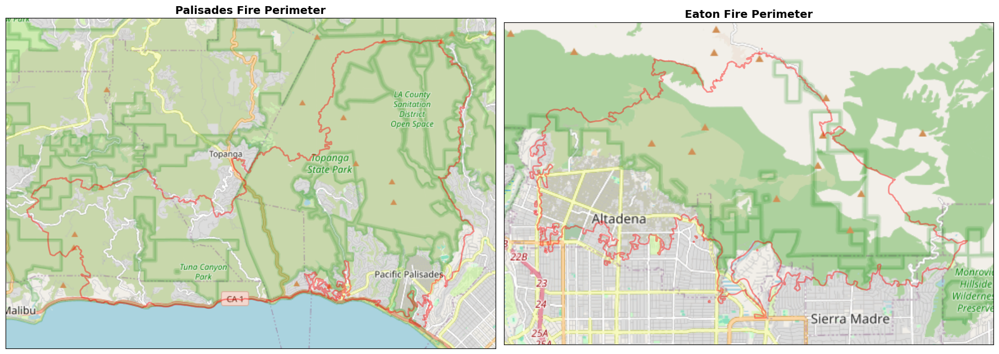

In [12]:
# MAP FIRE PERIMETERS WITH BASEMAP
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    gdf = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    bounds = gdf.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = gdf.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    gdf.plot(ax = ax, alpha = 0.4, edgecolor = "red", facecolor = "none", linewidth = 2)
    ax.set_title(f"{fire_name} Fire Perimeter", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "fire_perimeters.png", dpi = 300, bbox_inches = "tight")
plt.show()

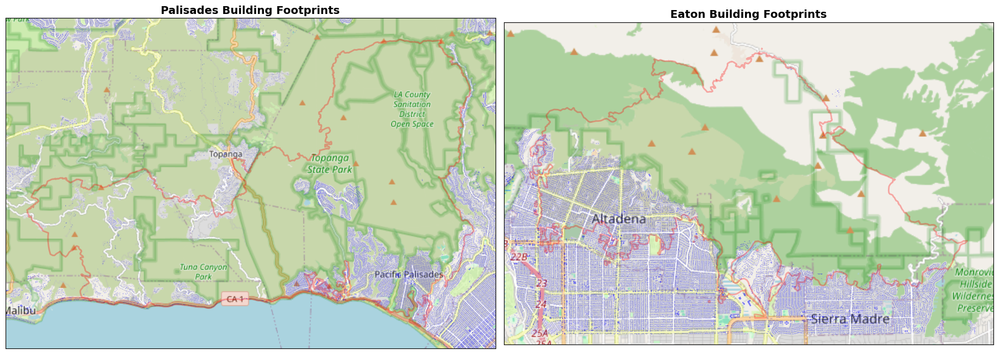

In [13]:
# MAP BUILDING FOOTPRINTS WITH BASEMAP
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    perimeter = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    buildings = vector_files[f"{fire_name}_buildings"].to_crs(epsg = 3857)
    bounds = perimeter.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = buildings.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    perimeter.plot(ax = ax, alpha = 0.3, edgecolor = "red", facecolor = "none", linewidth = 2)
    buildings.plot(ax = ax, alpha = 0.5, color = "blue", markersize = 1)
    ax.set_title(f"{fire_name} Building Footprints", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "building_footprints.png", dpi = 300, bbox_inches = "tight")
plt.show()

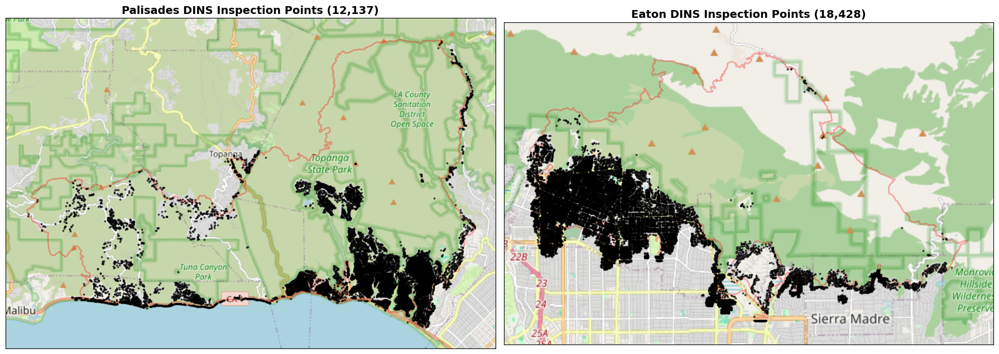

In [14]:
# MAP DINS DAMAGE POINTS WITH BASEMAP
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    perimeter = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    dins = vector_files[f"{fire_name}_dins"].to_crs(epsg = 3857)
    bounds = perimeter.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = dins.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    perimeter.plot(ax = ax, alpha = 0.3, edgecolor = "red", facecolor = "none", linewidth = 2)
    dins.plot(ax = ax, alpha = 0.6, color = "black", markersize = 3)
    ax.set_title(f"{fire_name} DINS Inspection Points ({len(dins):,})", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "dins_damage_points.png", dpi = 300, bbox_inches = "tight")
plt.show()

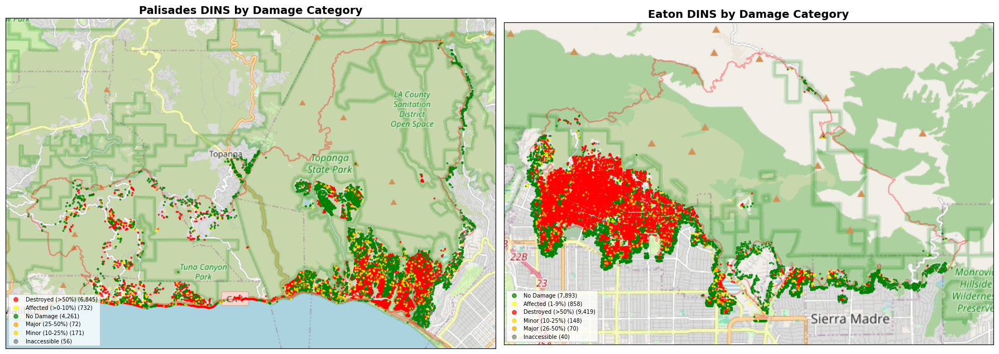

In [15]:
# MAP DINS BY DAMAGE CATEGORY
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

# Color assignment based on substring matching to handle cross-fire category variants.
# Palisades uses "Major (25-50%)" while Eaton uses "Major (26-50%)", etc.
def get_damage_color(category):
    cat_lower = str(category).lower()
    if "destroyed" in cat_lower:
        return "red"
    elif "major" in cat_lower:
        return "orange"
    elif "minor" in cat_lower:
        return "gold"
    elif "affected" in cat_lower:
        return "yellow"
    elif "inaccessible" in cat_lower:
        return "gray"
    elif "no damage" in cat_lower:
        return "green"
    return "purple"


for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    perimeter = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    dins = vector_files[f"{fire_name}_dins"].to_crs(epsg = 3857)
    bounds = perimeter.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = dins.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    perimeter.plot(ax = ax, alpha = 0.3, edgecolor = "red", facecolor = "none", linewidth = 2)

    if "DAMAGE" in dins.columns:
        for cat in dins["DAMAGE"].unique():
            subset = dins[dins["DAMAGE"] == cat]
            color = get_damage_color(cat)
            subset.plot(ax = ax, color = color, markersize = 3, alpha = 0.7, label = f"{cat} ({len(subset):,})")
        ax.legend(loc = "lower left", fontsize = 7, markerscale = 3)

    ax.set_title(f"{fire_name} DINS by Damage Category", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "dins_by_damage_category.png", dpi = 300, bbox_inches = "tight")
plt.show()

### Preprocessing Helper Functions

Reusable functions for STAC query, cloud masking, spectral index calculation, DEM processing, vector rasterization, and tensor stacking.

In [16]:
# STAC CATALOG CONNECTIONS
stac_catalog_url = "https://earth-search.aws.element84.com/v1"
stac_catalog = Client.open(stac_catalog_url)

dem_catalog_url = "https://planetarycomputer.microsoft.com/api/stac/v1"
dem_catalog = Client.open(dem_catalog_url, modifier = planetary_computer.sign_inplace)

In [17]:
def query_sentinel2(catalog, bbox, start_date, end_date, cloud_threshold = 30):
    """
    Query Sentinel-2 L2A imagery and return all scenes from the best date.
    Groups by acquisition date to handle bboxes that straddle tile boundaries.
    """
    search = catalog.search(
        collections = ["sentinel-2-l2a"],
        bbox = bbox,
        datetime = f"{start_date}/{end_date}",
        query = {"eo:cloud_cover": {"lt": cloud_threshold}},
    )
    items = list(search.item_collection())
    if not items:
        return [], items

    # Group scenes by acquisition date.
    from collections import defaultdict
    date_groups = defaultdict(list)
    for item in items:
        date_key = item.datetime.strftime("%Y-%m-%d")
        date_groups[date_key].append(item)

    # Select date with lowest mean cloud cover across tiles.
    best_date = min(
        date_groups.keys(),
        key = lambda d: np.mean([
            it.properties.get("eo:cloud_cover", 100) for it in date_groups[d]
        ])
    )

    best_items = date_groups[best_date]
    return best_items, items


def load_sentinel_bands(items, bbox, resolution, crs, bands = ["nir08", "swir16", "scl"]):
    """Load and mosaic specified bands from one or more STAC items into xarray."""
    data = odc.stac.load(
        items, bands = bands, bbox = bbox,
        resolution = resolution, crs = crs,
        chunks = {"x": 512, "y": 512},
        groupby = "solar_day",
    )
    return data


def apply_scl_mask(data, valid_classes = [2, 4, 5, 6, 7, 11]):
    """Apply SCL-based cloud and shadow mask to optical bands."""
    scl = data["scl"].squeeze()
    valid_mask = scl.isin(valid_classes)
    masked_nir = data["nir08"].where(valid_mask)
    masked_swir = data["swir16"].where(valid_mask)
    return masked_nir.squeeze(), masked_swir.squeeze(), valid_mask


def calc_nbr(nir, swir, epsilon = 1e-10):
    """Calculate Normalized Burn Ratio from NIR and SWIR bands."""
    nir = nir.astype(float)
    swir = swir.astype(float)
    return (nir - swir) / (nir + swir + epsilon)


def percentile_normalize(array, low_pct = 2, high_pct = 98):
    """Normalize array to [0, 1] using percentile clipping on nonzero pixels."""
    nonzero_mask = array > 0
    if np.sum(nonzero_mask) == 0:
        return array
    p_low = np.percentile(array[nonzero_mask], low_pct)
    p_high = np.percentile(array[nonzero_mask], high_pct)
    return np.clip((array - p_low) / (p_high - p_low + 1e-10), 0, 1)


def calculate_aspect(dem, cell_size):
    """Calculate compass aspect from DEM array."""
    dem_array = dem.values
    dy, dx = np.gradient(dem_array, cell_size)
    aspect_rad = np.arctan2(-dy, dx)
    aspect_deg = np.degrees(aspect_rad)
    return (90.0 - aspect_deg) % 360.0


def calculate_slope(dem, cell_size):
    """Calculate slope in degrees from DEM array."""
    dem_array = dem.values
    dy, dx = np.gradient(dem_array, cell_size)
    slope_rad = np.arctan(np.sqrt(dx**2 + dy**2))
    return np.degrees(slope_rad)


def rasterize_geometries(geometries, shape, transform, fill_value = 0, default_value = 1):
    """Rasterize vector geometries to a numpy array."""
    if len(geometries) == 0:
        return np.zeros(shape, dtype = np.uint8)
    shapes = [(geom, default_value) for geom in geometries]
    return features.rasterize(
        shapes = shapes, out_shape = shape,
        transform = transform, fill = fill_value, dtype = np.uint8,
    )

In [ ]:
def preprocess_fire(config, stac_catalog, dem_catalog,
                    pre_fire_start, pre_fire_end,
                    post_fire_start, post_fire_end,
                    target_crs, target_resolution):
    """
    Run the full preprocessing pipeline for a single fire event.
    Returns a dictionary with the feature tensor, target mask,
    AOI mask, and intermediate arrays for visualization.
    """
    name = config["name"]
    bbox = config["bbox"]

    print(f"PROCESSING {name.upper()} FIRE")

    # SENTINEL-2 IMAGERY
    print("  Querying Sentinel-2 pre-fire imagery...")
    best_pre_items, pre_items = query_sentinel2(stac_catalog, bbox, pre_fire_start, pre_fire_end)
    print("  Querying Sentinel-2 post-fire imagery...")
    best_post_items, post_items = query_sentinel2(stac_catalog, bbox, post_fire_start, post_fire_end)

    # Print all available scenes for verification.
    print(f"  Available Pre-Fire Scenes: {len(pre_items)}")
    for item in pre_items:
        cc = item.properties.get("eo:cloud_cover", "N/A")
        print(f"    {item.id} | {item.datetime.strftime('%Y-%m-%d')} | Cloud: {cc:.1f}%")
    print(f"  Selected Pre-Fire Date: {best_pre_items[0].datetime.strftime('%Y-%m-%d')} ({len(best_pre_items)} tiles)")
    for item in best_pre_items:
        print(f"    -> {item.id}")

    print(f"  Available Post-Fire Scenes: {len(post_items)}")
    for item in post_items:
        cc = item.properties.get("eo:cloud_cover", "N/A")
        print(f"    {item.id} | {item.datetime.strftime('%Y-%m-%d')} | Cloud: {cc:.1f}%")
    print(f"  Selected Post-Fire Date: {best_post_items[0].datetime.strftime('%Y-%m-%d')} ({len(best_post_items)} tiles)")
    for item in best_post_items:
        print(f"    -> {item.id}")

    # LOAD AND MOSAIC BANDS FROM ALL TILES ON BEST DATE
    pre_data = load_sentinel_bands(best_pre_items, bbox, target_resolution, target_crs)
    post_data = load_sentinel_bands(best_post_items, bbox, target_resolution, target_crs)

    # CLOUD MASKING
    pre_nir, pre_swir, pre_valid = apply_scl_mask(pre_data)
    post_nir, post_swir, post_valid = apply_scl_mask(post_data)
    print(f"  Pre-Fire Valid: {float(pre_valid.mean()) * 100:.1f}% | Post-Fire Valid: {float(post_valid.mean()) * 100:.1f}%")

    # NBR AND DNBR
    nbr_pre = calc_nbr(pre_nir, pre_swir)
    nbr_post = calc_nbr(post_nir, post_swir)
    dnbr = nbr_pre - nbr_post
    combined_valid = pre_valid & post_valid
    dnbr_masked = dnbr.where(combined_valid)

    # SPATIAL REFERENCE
    sentinel_shape = (post_data.sizes["y"], post_data.sizes["x"])
    sentinel_bounds = post_data.rio.bounds()
    raster_transform = from_bounds(
        sentinel_bounds[0], sentinel_bounds[1],
        sentinel_bounds[2], sentinel_bounds[3],
        sentinel_shape[1], sentinel_shape[0],
    )
    print(f"  Raster Shape: {sentinel_shape}")

    # DEM AND ASPECT
    print("  Loading DEM...")
    dem_search = dem_catalog.search(collections = ["3dep-seamless"], bbox = bbox)
    dem_items = list(dem_search.item_collection())
    dem_data = odc.stac.load(
        dem_items, bands = ["data"], bbox = bbox,
        resolution = target_resolution, crs = target_crs,
        chunks = {"x": 512, "y": 512},
    )
    elevation_raw = dem_data["data"].max(dim = "time").squeeze()
    elevation_raw = elevation_raw.rio.write_crs(target_crs)
    post_spatial = post_data.squeeze()
    elevation_aligned = elevation_raw.rio.reproject_match(post_spatial)
    aspect_array = calculate_aspect(elevation_aligned, target_resolution)
    aspect_normalized = aspect_array / 360.0
    slope_array = calculate_slope(elevation_aligned, target_resolution)

    # VECTOR DATA
    print("  Rasterizing vectors...")
    bbox_geometry = box(bbox[0], bbox[1], bbox[2], bbox[3])
    fire_perimeter_gdf = gpd.read_file(config["perimeter_path"])
    fire_perimeter_proj = fire_perimeter_gdf.to_crs(target_crs)
    transformer = Transformer.from_crs("EPSG:4326", target_crs, always_xy = True)
    bbox_min_x, bbox_min_y = transformer.transform(bbox[0], bbox[1])
    bbox_max_x, bbox_max_y = transformer.transform(bbox[2], bbox[3])
    bbox_proj = box(bbox_min_x, bbox_min_y, bbox_max_x, bbox_max_y)
    fire_perimeter_clipped = fire_perimeter_proj.clip(bbox_proj)

    buildings_gdf = gpd.read_file(config["buildings_path"], bbox = bbox_geometry, engine = "pyogrio")
    buildings_proj = buildings_gdf.to_crs(target_crs)

    dins_gdf = gpd.read_file(config["dins_path"], bbox = bbox_geometry)
    # Filter to all structures with any damage by excluding "No Damage".
    if "DAMAGE" in dins_gdf.columns:
        dins_damaged = dins_gdf[dins_gdf["DAMAGE"] != "No Damage"].copy()
    else:
        dins_damaged = dins_gdf.copy()
    dins_proj = dins_damaged.to_crs(target_crs)
    print(f"  DINS Damaged Structures: {len(dins_proj)}")

    # RASTERIZATION
    aoi_mask = rasterize_geometries(fire_perimeter_clipped.geometry, sentinel_shape, raster_transform)
    building_raster = rasterize_geometries(buildings_proj.geometry, sentinel_shape, raster_transform)
    dins_buffered = dins_proj.copy()
    dins_buffered.geometry = dins_buffered.geometry.buffer(15)
    dins_buffered_dissolved = dins_buffered.dissolve()
    damaged_raster = rasterize_geometries(dins_buffered_dissolved.geometry, sentinel_shape, raster_transform)

    # DINS-ONLY TARGET
    y_target = damaged_raster.copy()

    # FEATURE-LABEL INDEPENDENCE CHECK
    label_and_building = np.sum((damaged_raster == 1) & (building_raster == 1))
    label_total = np.sum(damaged_raster == 1)
    overlap_pct = (label_and_building / label_total) * 100 if label_total > 0 else 0
    correlation = np.corrcoef(building_raster.flatten(), damaged_raster.flatten())[0, 1]
    print(f"  Feature-Label Correlation: {correlation:.4f}")
    print(f"  Damage-Building Overlap: {overlap_pct:.1f}%")

    # PREPARE CHANNELS
    dnbr_array = dnbr_masked.values
    channel_dnbr = np.nan_to_num(dnbr_array.copy(), nan = 0.0)
    channel_aspect = np.nan_to_num(aspect_normalized.copy(), nan = 0.0)
    channel_buildings = building_raster.astype(float)
    channel_pre_nir = percentile_normalize(np.nan_to_num(pre_nir.values.copy(), nan = 0.0))
    channel_pre_swir = percentile_normalize(np.nan_to_num(pre_swir.values.copy(), nan = 0.0))
    channel_post_nir = percentile_normalize(np.nan_to_num(post_nir.values.copy(), nan = 0.0))
    channel_post_swir = percentile_normalize(np.nan_to_num(post_swir.values.copy(), nan = 0.0))

    # STACK TENSOR
    X_tensor = np.stack([
        channel_dnbr, channel_aspect, channel_buildings,
        channel_pre_nir, channel_pre_swir, channel_post_nir, channel_post_swir,
    ], axis = -1)

    print(f"  X_tensor: {X_tensor.shape} | y_target: {y_target.shape}")
    print(f"  Damaged Pixels: {np.sum(y_target == 1):,} | AOI Pixels: {np.sum(aoi_mask == 1):,}")
    print(f"  Imbalance: {np.sum(y_target == 0) / max(np.sum(y_target == 1), 1):.1f}:1")

    return {
        "name": name,
        "X_tensor": X_tensor,
        "y_target": y_target,
        "aoi_mask": aoi_mask,
        "sentinel_shape": sentinel_shape,
        "nbr_pre": nbr_pre.values,
        "nbr_post": nbr_post.values,
        "dnbr": dnbr_array,
        "aspect_degrees": aspect_array,
        "slope_degrees": slope_array,
        "building_raster": building_raster,
        "damaged_raster": damaged_raster,
    }


### Process Both Fires

In [19]:
# PROCESS EACH FIRE
fire_data = {}
for config in fire_configs:
    result = preprocess_fire(
        config, stac_catalog, dem_catalog,
        pre_fire_start, pre_fire_end,
        post_fire_start, post_fire_end,
        target_crs, target_resolution,
    )
    fire_data[result["name"]] = result
    print()

PROCESSING PALISADES FIRE
  Querying Sentinel-2 pre-fire imagery...
  Querying Sentinel-2 post-fire imagery...
  Available Pre-Fire Scenes: 3
    S2A_11SLT_20250102_0_L2A | 2025-01-02 | Cloud: 3.0%
    S2B_11SLT_20241218_0_L2A | 2024-12-18 | Cloud: 0.0%
    S2A_11SLT_20241213_0_L2A | 2024-12-13 | Cloud: 21.5%
  Selected Pre-Fire Date: 2024-12-18 (1 tiles)
    -> S2B_11SLT_20241218_0_L2A
  Available Post-Fire Scenes: 2
    S2C_11SLT_20250221_0_L2A | 2025-02-21 | Cloud: 5.0%
    S2C_11SLT_20250201_0_L2A | 2025-02-01 | Cloud: 15.8%
  Selected Post-Fire Date: 2025-02-21 (1 tiles)
    -> S2C_11SLT_20250221_0_L2A
  Pre-Fire Valid: 100.0% | Post-Fire Valid: 96.0%
  Raster Shape: (801, 1173)
  Loading DEM...
  Rasterizing vectors...
  DINS Damaged Structures: 7876
  Feature-Label Correlation: 0.1907
  Damage-Building Overlap: 38.3%
  X_tensor: (801, 1173, 7) | y_target: (801, 1173)
  Damaged Pixels: 10,111 | AOI Pixels: 243,261
  Imbalance: 91.9:1

PROCESSING EATON FIRE
  Querying Sentinel-2 p

### Preprocessing Visualizations

Visual verification of all intermediate raster layers produced by the preprocessing pipeline.

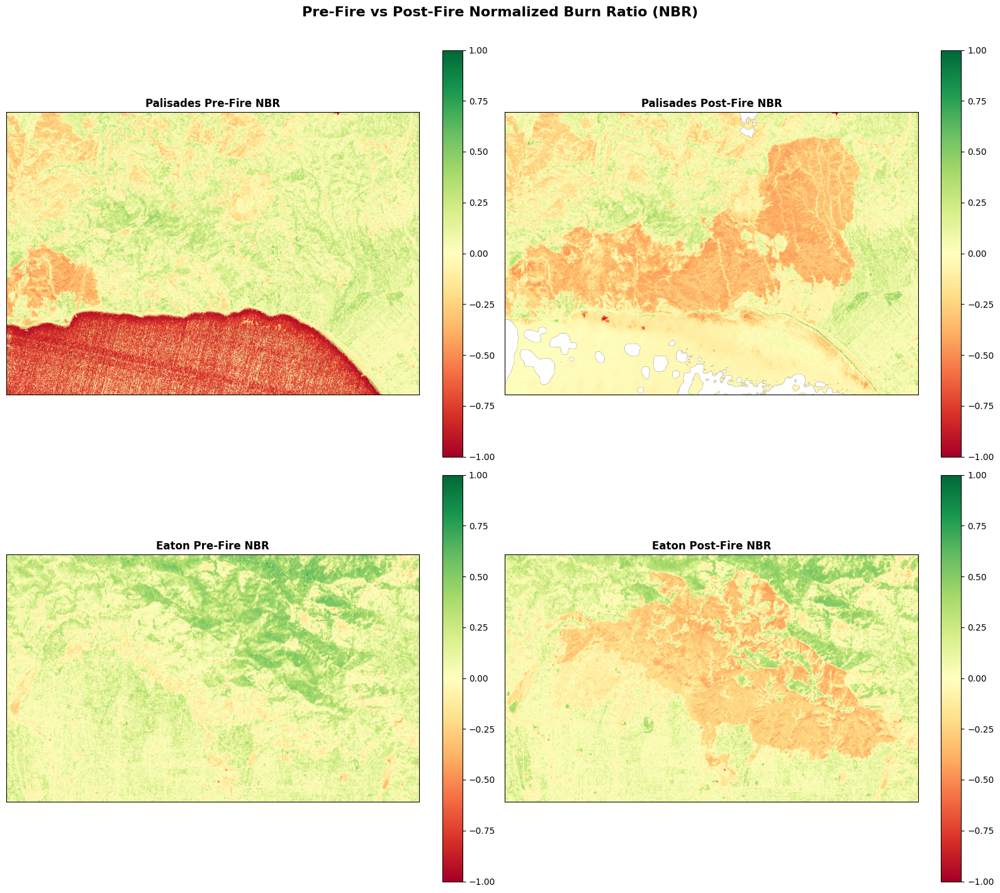

In [20]:
# NBR COMPARISON: PRE-FIRE VS POST-FIRE
fig, axes = plt.subplots(2, 2, figsize = (16, 14))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    im0 = axes[idx, 0].imshow(data["nbr_pre"], cmap = "RdYlGn", vmin = -1, vmax = 1)
    axes[idx, 0].set_title(f"{fire_name} Pre-Fire NBR", fontweight = "bold")
    axes[idx, 0].xaxis.set_visible(False)
    axes[idx, 0].yaxis.set_visible(False)
    plt.colorbar(im0, ax = axes[idx, 0], fraction = 0.05)

    im1 = axes[idx, 1].imshow(data["nbr_post"], cmap = "RdYlGn", vmin = -1, vmax = 1)
    axes[idx, 1].set_title(f"{fire_name} Post-Fire NBR", fontweight = "bold")
    axes[idx, 1].xaxis.set_visible(False)
    axes[idx, 1].yaxis.set_visible(False)
    plt.colorbar(im1, ax = axes[idx, 1], fraction = 0.05)

plt.suptitle("Pre-Fire vs Post-Fire Normalized Burn Ratio (NBR)", fontsize = 16, fontweight = "bold", y = 1.01)
plt.tight_layout()
plt.savefig(images_path / "nbr_pre_vs_post.png", dpi = 300, bbox_inches = "tight")
plt.show()

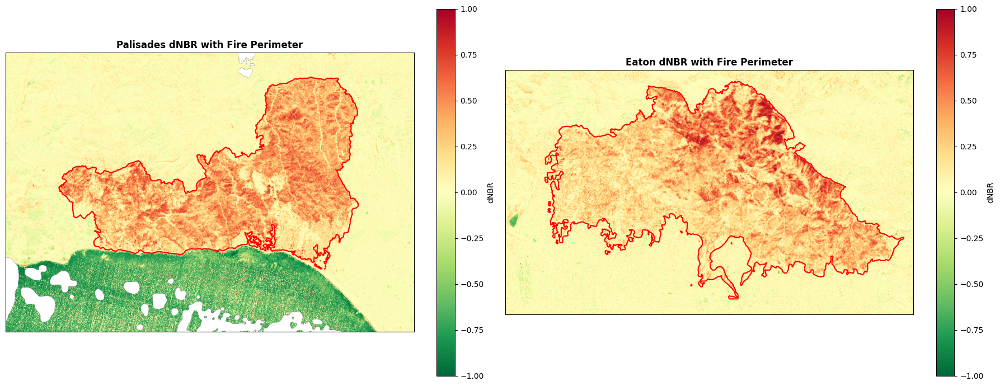

In [21]:
# DNBR WITH AOI OVERLAY
fig, axes = plt.subplots(1, 2, figsize = (18, 7))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    im = axes[idx].imshow(data["dnbr"], cmap = "RdYlGn_r", vmin = -1, vmax = 1)
    axes[idx].contour(data["aoi_mask"], levels = [0.5], colors = "red", linewidths = 1.5)
    axes[idx].set_title(f"{fire_name} dNBR with Fire Perimeter", fontweight = "bold")
    axes[idx].xaxis.set_visible(False)
    axes[idx].yaxis.set_visible(False)
    plt.colorbar(im, ax = axes[idx], fraction = 0.05, label = "dNBR")

plt.tight_layout()
plt.savefig(images_path / "dnbr_with_aoi.png", dpi = 300, bbox_inches = "tight")
plt.show()

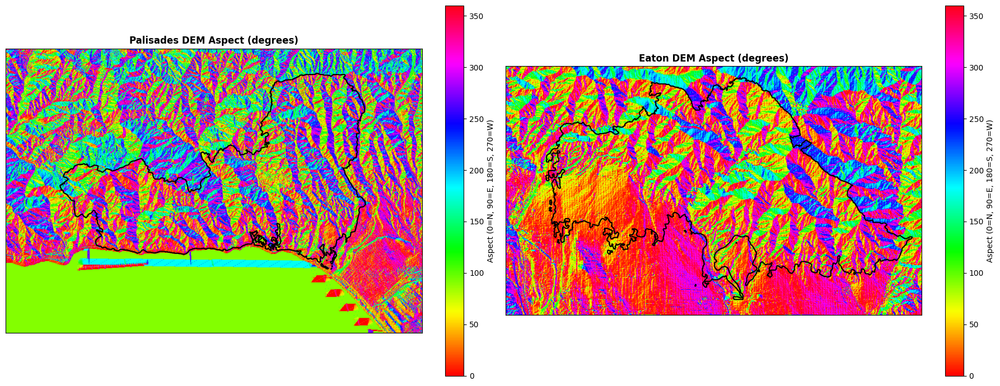

In [22]:
# DEM ASPECT
fig, axes = plt.subplots(1, 2, figsize = (18, 7))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    im = axes[idx].imshow(data["aspect_degrees"], cmap = "hsv", vmin = 0, vmax = 360)
    axes[idx].contour(data["aoi_mask"], levels = [0.5], colors = "black", linewidths = 1.5)
    axes[idx].set_title(f"{fire_name} DEM Aspect (degrees)", fontweight = "bold")
    axes[idx].xaxis.set_visible(False)
    axes[idx].yaxis.set_visible(False)
    plt.colorbar(im, ax = axes[idx], fraction = 0.05, label = "Aspect (0=N, 90=E, 180=S, 270=W)")

plt.tight_layout()
plt.savefig(images_path / "dem_aspect.png", dpi = 300, bbox_inches = "tight")
plt.show()

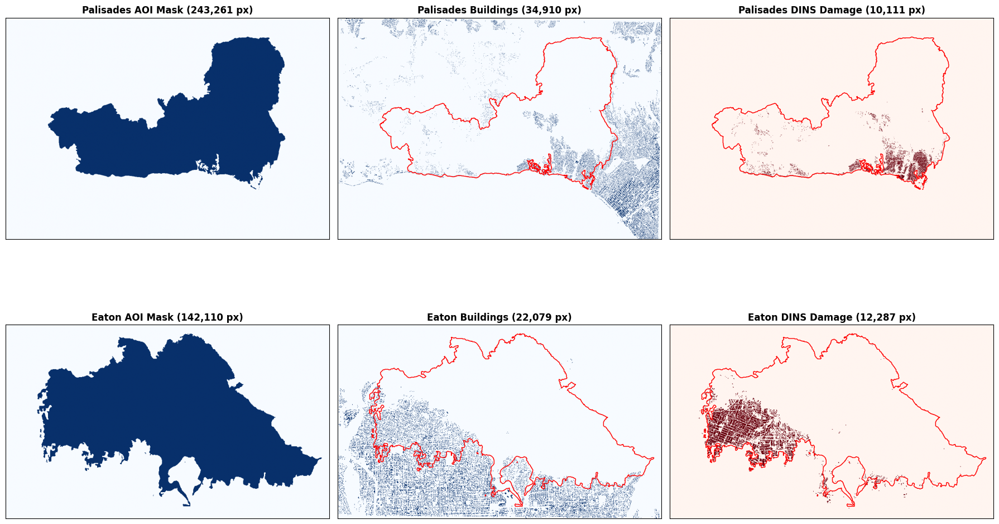

In [23]:
# RASTERIZED LAYERS: AOI, BUILDINGS, DINS DAMAGE
fig, axes = plt.subplots(2, 3, figsize = (18, 12))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]

    axes[idx, 0].imshow(data["aoi_mask"], cmap = "Blues")
    axes[idx, 0].set_title(f"{fire_name} AOI Mask ({np.sum(data['aoi_mask']):,} px)", fontweight = "bold")

    axes[idx, 1].imshow(data["building_raster"], cmap = "Blues")
    axes[idx, 1].contour(data["aoi_mask"], levels = [0.5], colors = "red", linewidths = 1)
    axes[idx, 1].set_title(f"{fire_name} Buildings ({np.sum(data['building_raster']):,} px)", fontweight = "bold")

    axes[idx, 2].imshow(data["damaged_raster"], cmap = "Reds")
    axes[idx, 2].contour(data["aoi_mask"], levels = [0.5], colors = "red", linewidths = 1)
    axes[idx, 2].set_title(f"{fire_name} DINS Damage ({np.sum(data['damaged_raster']):,} px)", fontweight = "bold")

    for j in range(3):
        axes[idx, j].xaxis.set_visible(False)
        axes[idx, j].yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "rasterized_layers.png", dpi = 300, bbox_inches = "tight")
plt.show()

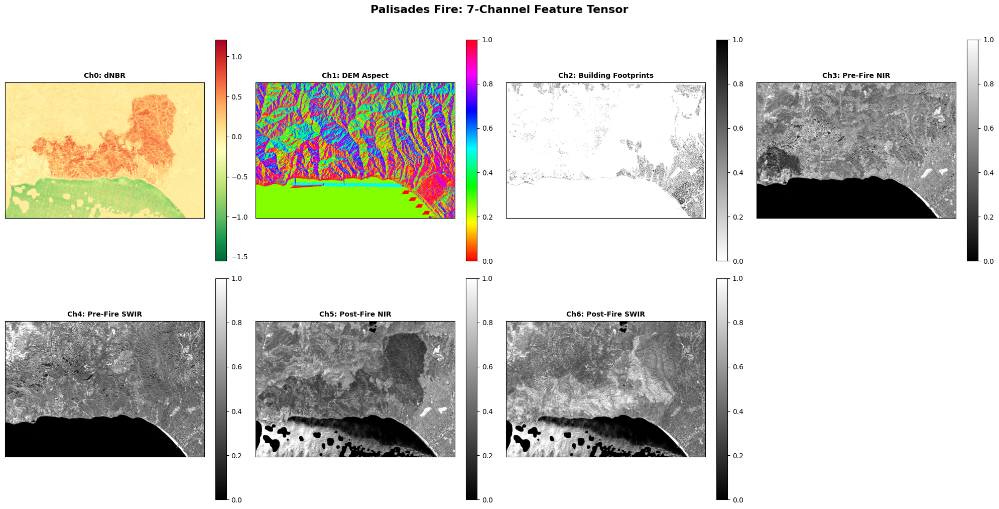

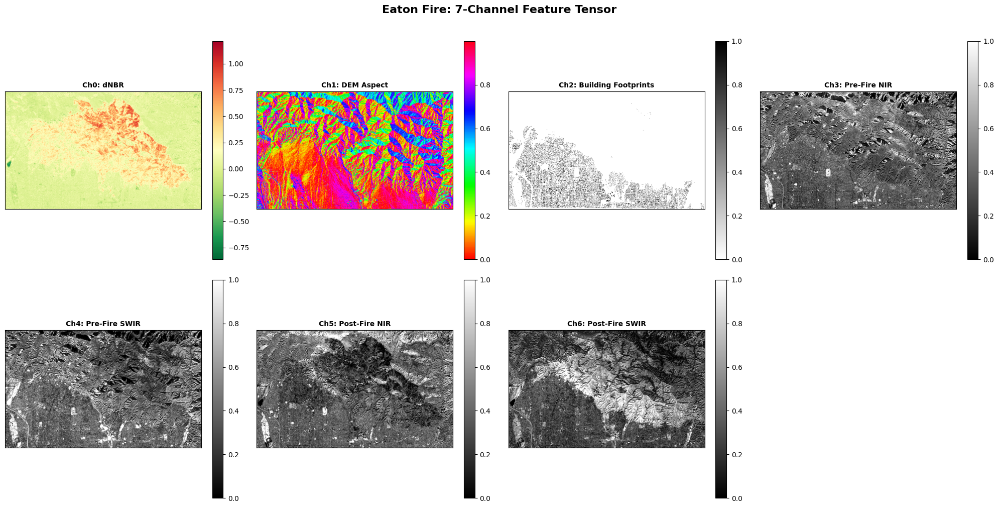

In [24]:
# ALL 7 TENSOR CHANNELS FOR EACH FIRE
channel_names_vis = [
    "dNBR", "DEM Aspect", "Building Footprints",
    "Pre-Fire NIR", "Pre-Fire SWIR", "Post-Fire NIR", "Post-Fire SWIR",
]
channel_cmaps = ["RdYlGn_r", "hsv", "binary", "gray", "gray", "gray", "gray"]

for fire_name in ["Palisades", "Eaton"]:
    data = fire_data[fire_name]
    fig, axes = plt.subplots(2, 4, figsize = (20, 10))
    axes = axes.flatten()

    for ch_idx in range(7):
        ch_data = data["X_tensor"][:, :, ch_idx]
        im = axes[ch_idx].imshow(ch_data, cmap = channel_cmaps[ch_idx])
        axes[ch_idx].set_title(f"Ch{ch_idx}: {channel_names_vis[ch_idx]}", fontweight = "bold", fontsize = 10)
        axes[ch_idx].xaxis.set_visible(False)
        axes[ch_idx].yaxis.set_visible(False)
        plt.colorbar(im, ax = axes[ch_idx], fraction = 0.05)

    axes[7].axis('off') # Hide the empty 8th subplot.

    plt.suptitle(f"{fire_name} Fire: 7-Channel Feature Tensor", fontsize = 16, fontweight = "bold", y = 1.01)
    plt.tight_layout()
    plt.savefig(images_path / f"tensor_channels_{fire_name.lower()}.png", dpi = 300, bbox_inches = "tight")
    plt.show()


### Combined Dataset Statistics

In [25]:
# COMBINED DATASET STATISTICS
total_damaged = sum(np.sum(d["y_target"] == 1) for d in fire_data.values())
total_aoi = sum(np.sum(d["aoi_mask"] == 1) for d in fire_data.values())
channels = list(fire_data.values())[0]["X_tensor"].shape[2]

print("COMBINED DATASET")
for name, data in fire_data.items():
    d = np.sum(data["y_target"] == 1)
    a = np.sum(data["aoi_mask"] == 1)
    print(f"  {name}: {data['X_tensor'].shape} | Damaged: {d:,} | AOI: {a:,} | Damage %: {d/a*100:.2f}%")

print(f"\nTotal Damaged Pixels: {total_damaged:,}")
print(f"Total AOI Pixels: {total_aoi:,}")
print(f"Combined Damage % of AOI: {total_damaged / total_aoi * 100:.2f}%")
print(f"Combined Imbalance Ratio: {(total_aoi - total_damaged) / max(total_damaged, 1):.1f}:1")
print(f"Feature Channels: {channels}")

COMBINED DATASET
  Palisades: (801, 1173, 7) | Damaged: 10,111 | AOI: 243,261 | Damage %: 4.16%
  Eaton: (465, 778, 7) | Damaged: 12,287 | AOI: 142,110 | Damage %: 8.65%

Total Damaged Pixels: 22,398
Total AOI Pixels: 385,371
Combined Damage % of AOI: 5.81%
Combined Imbalance Ratio: 16.2:1
Feature Channels: 7


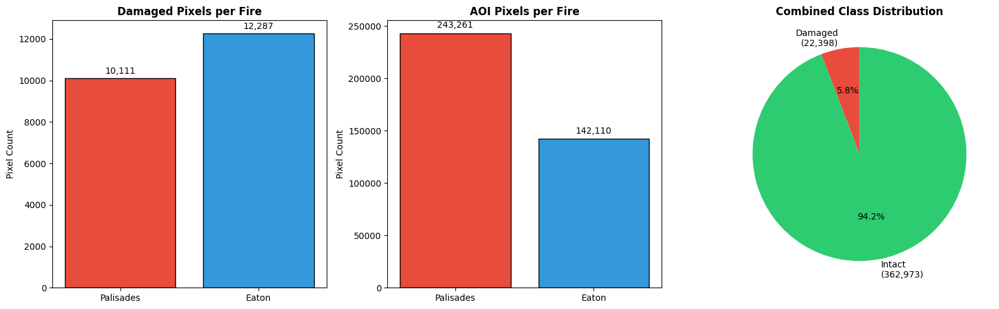

In [26]:
# CLASS DISTRIBUTION BAR CHART
fig, axes = plt.subplots(1, 3, figsize = (16, 5))

fire_names = list(fire_data.keys())
damaged_counts = [np.sum(fire_data[n]["y_target"] == 1) for n in fire_names]
intact_counts = [np.sum(fire_data[n]["aoi_mask"] == 1) - np.sum(fire_data[n]["y_target"] == 1) for n in fire_names]

# Per-fire damage pixel counts.
axes[0].bar(fire_names, damaged_counts, color = ["#E74C3C", "#3498DB"], edgecolor = "black")
for i, v in enumerate(damaged_counts):
    axes[0].text(i, v + 200, f"{v:,}", ha = "center", fontsize = 10)
axes[0].set_ylabel("Pixel Count")
axes[0].set_title("Damaged Pixels per Fire", fontweight = "bold")

# Per-fire AOI pixel counts.
aoi_counts = [np.sum(fire_data[n]["aoi_mask"] == 1) for n in fire_names]
axes[1].bar(fire_names, aoi_counts, color = ["#E74C3C", "#3498DB"], edgecolor = "black")
for i, v in enumerate(aoi_counts):
    axes[1].text(i, v + 5000, f"{v:,}", ha = "center", fontsize = 10)
axes[1].set_ylabel("Pixel Count")
axes[1].set_title("AOI Pixels per Fire", fontweight = "bold")

# Combined class distribution pie.
axes[2].pie([total_damaged, total_aoi - total_damaged],
            labels = [f"Damaged\n({total_damaged:,})", f"Intact\n({total_aoi - total_damaged:,})"],
            colors = ["#E74C3C", "#2ECC71"], autopct = "%.1f%%", startangle = 90,
            textprops = {"fontsize": 10})
axes[2].set_title("Combined Class Distribution", fontweight = "bold")

plt.tight_layout()
plt.savefig(images_path / "class_distribution.png", dpi = 300, bbox_inches = "tight")
plt.show()

### Spatial K-Fold Cross-Validation (Multi-Fire)

Spatial blocks computed independently per fire with globally unique IDs. Stratified assignment ensures damage blocks are evenly distributed across folds.

In [27]:
# BLOCK PARAMETERS
block_size = 64
patch_size = 64
n_folds = 5

channel_names = [
    "dNBR", "DEM Aspect", "Building Footprints",
    "Pre-Fire NIR", "Pre-Fire SWIR", "Post-Fire NIR", "Post-Fire SWIR",
]

# COMPUTE BLOCK ASSIGNMENTS
fire_block_data = {}
block_id_offset = 0

for fire_name, data in fire_data.items():
    height, width = data["X_tensor"].shape[:2]
    n_blocks_y = int(np.ceil(height / block_size))
    n_blocks_x = int(np.ceil(width / block_size))
    y_indices, x_indices = np.meshgrid(np.arange(height), np.arange(width), indexing = "ij")
    block_y = y_indices // block_size
    block_x = x_indices // block_size
    block_ids = block_y * n_blocks_x + block_x + block_id_offset

    fire_block_data[fire_name] = {
        "block_ids": block_ids,
        "n_blocks_y": n_blocks_y,
        "n_blocks_x": n_blocks_x,
        "block_offset": block_id_offset,
    }
    print(f"{fire_name}: {n_blocks_y}x{n_blocks_x} blocks, IDs [{block_id_offset}, {block_id_offset + n_blocks_y * n_blocks_x - 1}]")
    block_id_offset += n_blocks_y * n_blocks_x

print(f"Total Unique Blocks: {block_id_offset}")


Palisades: 13x19 blocks, IDs [0, 246]
Eaton: 8x13 blocks, IDs [247, 350]
Total Unique Blocks: 351


In [28]:
# STRATIFIED K-FOLD ASSIGNMENT
all_block_ids = []
block_damage_counts = {}

for fire_name, data in fire_data.items():
    block_ids = fire_block_data[fire_name]["block_ids"]
    y_target = data["y_target"]
    aoi_mask = data["aoi_mask"]
    for bid in np.unique(block_ids):
        block_mask = block_ids == bid
        damaged_in_block = np.sum((y_target[block_mask] == 1) & (aoi_mask[block_mask] == 1))
        block_damage_counts[bid] = damaged_in_block
    all_block_ids.extend(np.unique(block_ids))

all_blocks = sorted(all_block_ids)
block_has_damage = np.array([1 if block_damage_counts[b] > 0 else 0 for b in all_blocks])

skf = StratifiedKFold(n_splits = n_folds, shuffle = True, random_state = random_seed)
block_to_fold = {}
fold_blocks = {fold: [] for fold in range(n_folds)}

for fold_idx, (train_idx, test_idx) in enumerate(skf.split(all_blocks, block_has_damage)):
    for idx in test_idx:
        block_id = all_blocks[idx]
        block_to_fold[block_id] = fold_idx
        fold_blocks[fold_idx].append(block_id)

blocks_with_damage = sum(1 for b in all_blocks if block_damage_counts[b] > 0)
print(f"Blocks with Damage: {blocks_with_damage}")
print(f"Blocks without Damage: {len(all_blocks) - blocks_with_damage}")
print()

for fold in range(n_folds):
    fd = sum(1 for b in fold_blocks[fold] if block_damage_counts[b] > 0)
    fp = sum(block_damage_counts[b] for b in fold_blocks[fold])
    print(f"Fold {fold + 1}: {len(fold_blocks[fold])} blocks, {fd} with damage, {fp:,} damage pixels")

Blocks with Damage: 86
Blocks without Damage: 265

Fold 1: 71 blocks, 18 with damage, 2,692 damage pixels
Fold 2: 70 blocks, 17 with damage, 2,279 damage pixels
Fold 3: 70 blocks, 17 with damage, 5,740 damage pixels
Fold 4: 70 blocks, 17 with damage, 3,965 damage pixels
Fold 5: 70 blocks, 17 with damage, 6,805 damage pixels


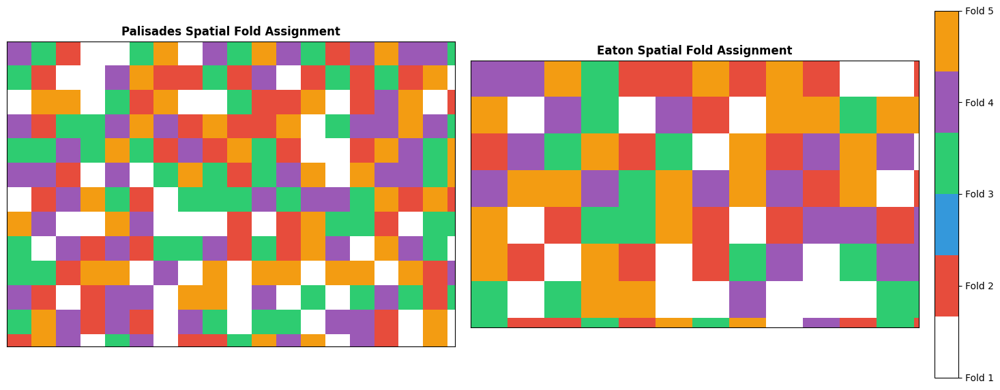

In [29]:
# VISUALIZE FOLD ASSIGNMENTS PER FIRE
fig = plt.figure(figsize = (18, 7))
gs = fig.add_gridspec(1, 3, width_ratios = [1.5, 1.5, 0.08], wspace = 0.05)
axes = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])]

cmap_folds = plt.cm.colors.ListedColormap(["white", "#E74C3C", "#3498DB", "#2ECC71", "#9B59B6", "#F39C12"])

im = None
for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    block_ids = fire_block_data[fire_name]["block_ids"]
    height, width = data["X_tensor"].shape[:2]
    fold_vis = np.zeros((height, width), dtype = np.uint8)
    for bid, fold in block_to_fold.items():
        fold_vis[block_ids == bid] = fold + 1

    im = axes[idx].imshow(fold_vis, cmap = cmap_folds, interpolation = "nearest")
    axes[idx].set_title(f"{fire_name} Spatial Fold Assignment", fontweight = "bold")
    axes[idx].xaxis.set_visible(False)
    axes[idx].yaxis.set_visible(False)

cax = fig.add_subplot(gs[0, 2])
cbar = fig.colorbar(im, cax = cax, ticks = range(n_folds + 1))
cbar.set_ticklabels(["Outside"] + [f"Fold {i+1}" for i in range(n_folds)])

plt.savefig(images_path / "fold_assignments.png", dpi = 300, bbox_inches = "tight")
plt.show()

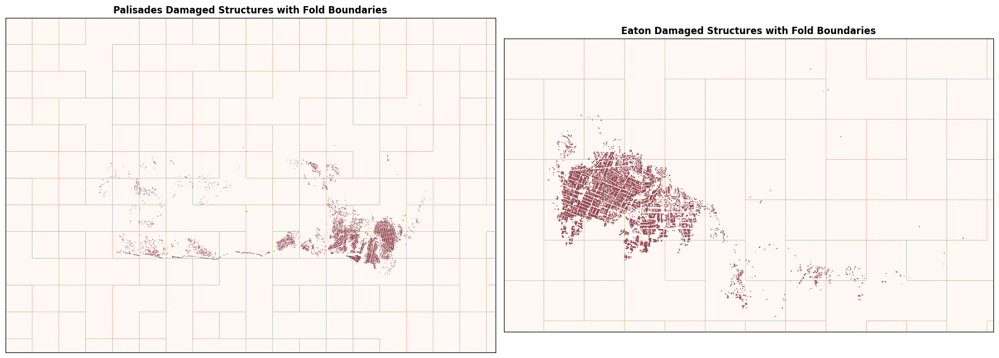

In [30]:
# DAMAGED STRUCTURES WITH FOLD BOUNDARIES PER FIRE
fig, axes = plt.subplots(1, 2, figsize = (18, 7))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    block_ids = fire_block_data[fire_name]["block_ids"]
    height, width = data["X_tensor"].shape[:2]

    fold_vis = np.zeros((height, width), dtype = np.uint8)
    for bid, fold in block_to_fold.items():
        fold_vis[block_ids == bid] = fold + 1

    axes[idx].imshow(data["y_target"], cmap = "Reds", alpha = 0.7)
    for fold in range(n_folds):
        axes[idx].contour(fold_vis == fold + 1, colors = [plt.cm.tab10(fold)], linewidths = 0.3, alpha = 0.5)
    axes[idx].set_title(f"{fire_name} Damaged Structures with Fold Boundaries", fontsize = 12, fontweight = "bold")
    axes[idx].xaxis.set_visible(False)
    axes[idx].yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "damaged_with_folds.png", dpi = 300, bbox_inches = "tight")
plt.show()

In [31]:
def extract_fold_patches_multifire(fire_data, fire_block_data, block_to_fold,
                                   test_fold, patch_size, n_folds):
    """Extract spatially aligned patches from all fires combined."""
    val_fold = (test_fold - 1) % n_folds
    n_channels = list(fire_data.values())[0]["X_tensor"].shape[2]

    train_X, train_y = [], []
    val_X, val_y = [], []
    test_X, test_y = [], []
    train_damage_counts = []

    for fire_name, data in fire_data.items():
        X_tensor = data["X_tensor"]
        y_target = data["y_target"]
        aoi_mask = data["aoi_mask"]
        block_ids = fire_block_data[fire_name]["block_ids"]
        height, width = X_tensor.shape[:2]

        for row in range(0, height - patch_size + 1, patch_size):
            for col in range(0, width - patch_size + 1, patch_size):
                mask_patch = aoi_mask[row:row + patch_size, col:col + patch_size]
                if np.mean(mask_patch) < 0.10:
                    continue

                X_patch = X_tensor[row:row + patch_size, col:col + patch_size, :]
                y_patch = y_target[row:row + patch_size, col:col + patch_size]

                center_r = row + patch_size // 2
                center_c = col + patch_size // 2
                bid = block_ids[center_r, center_c]

                if bid not in block_to_fold:
                    continue

                fold = block_to_fold[bid]
                damage_count = np.sum(y_patch == 1)

                if fold == test_fold:
                    test_X.append(X_patch)
                    test_y.append(y_patch)
                elif fold == val_fold:
                    val_X.append(X_patch)
                    val_y.append(y_patch)
                else:
                    train_X.append(X_patch)
                    train_y.append(y_patch)
                    train_damage_counts.append(damage_count)

    # Oversampling.
    oversampled_X, oversampled_y = [], []
    for i, dc in enumerate(train_damage_counts):
        if dc > 0:
            for _ in range(2):
                oversampled_X.append(train_X[i])
                oversampled_y.append(train_y[i])
    train_X.extend(oversampled_X)
    train_y.extend(oversampled_y)

    empty_X = np.empty((0, patch_size, patch_size, n_channels))
    empty_y = np.empty((0, patch_size, patch_size, 1))

    X_train = np.nan_to_num(np.array(train_X), nan = 0.0) if train_X else empty_X
    y_train = np.array(train_y)[..., np.newaxis] if train_y else empty_y
    X_val = np.nan_to_num(np.array(val_X), nan = 0.0) if val_X else empty_X
    y_val = np.array(val_y)[..., np.newaxis] if val_y else empty_y
    X_test = np.nan_to_num(np.array(test_X), nan = 0.0) if test_X else empty_X
    y_test = np.array(test_y)[..., np.newaxis] if test_y else empty_y

    return X_train, y_train, X_val, y_val, X_test, y_test

In [32]:
# VERIFY PATCH EXTRACTION (FOLD 0)
X_train, y_train, X_val, y_val, X_test, y_test = extract_fold_patches_multifire(
    fire_data, fire_block_data, block_to_fold,
    test_fold = 0, patch_size = patch_size, n_folds = n_folds,
)

print("PATCH EXTRACTION VERIFICATION (FOLD 0 AS TEST)")
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_val:   {X_val.shape}, y_val:   {y_val.shape}")
print(f"X_test:  {X_test.shape}, y_test:  {y_test.shape}")
print(f"Training patches with damage: {np.sum(np.any(y_train[..., 0] == 1, axis = (1, 2)))}")

assert X_train.shape[1:3] == (64, 64)
assert y_train.shape[-1] == 1
print("PASS: All assertions verified.")

PATCH EXTRACTION VERIFICATION (FOLD 0 AS TEST)
X_train: (174, 64, 64, 7), y_train: (174, 64, 64, 1)
X_val:   (23, 64, 64, 7), y_val:   (23, 64, 64, 1)
X_test:  (24, 64, 64, 7), y_test:  (24, 64, 64, 1)
Training patches with damage: 147
PASS: All assertions verified.


In [33]:
# FOLD BALANCE VERIFICATION
print(f"{'Fold':<6} {'Train Patches':>14} {'Val Patches':>12} {'Test Patches':>13} {'Train Dmg Px':>13} {'Test Dmg Px':>12}")
for test_fold in range(n_folds):
    X_tr, y_tr, X_v, y_v, X_te, y_te = extract_fold_patches_multifire(
        fire_data, fire_block_data, block_to_fold, test_fold, patch_size, n_folds,
    )
    print(f"  {test_fold+1:<4} {X_tr.shape[0]:>14} {X_v.shape[0]:>12} {X_te.shape[0]:>13} {np.sum(y_tr[...,0]==1):>13,} {np.sum(y_te[...,0]==1):>12,}")

Fold    Train Patches  Val Patches  Test Patches  Train Dmg Px  Test Dmg Px
  1               174           23            24        36,720        2,742
  2               170           24            27        50,499        2,342
  3               158           27            26        41,109        5,872
  4               160           26            23        36,057        4,026
  5               169           23            23        32,868        6,935


## Modeling Approach

### Baseline Model: Random Forest with Spatial K-Fold CV

The baseline model is a pixel-wise Random Forest classifier from `scikit-learn`, chosen because it requires no spatial context and treats each pixel independently. This establishes a performance floor: any improvement from the U-Net must come from its ability to learn spatial patterns across neighboring pixels rather than from the spectral features alone.

Each 64 by 64 patch is flattened so that every pixel becomes an independent sample with 7 features (the same tensor channels used by the U-Net). The Random Forest is trained with class-weight balancing set to "balanced" to account for the class imbalance. No hyperparameter tuning is performed beyond this default configuration, keeping the baseline deliberately simple.

The Random Forest is evaluated using the same 5-fold spatial block cross-validation as the U-Net, ensuring that the comparison is fair, so both models see identical training, validation, and test splits with no spatial leakage between folds. Feature importance scores are recorded per fold to verify which channels the baseline relies on most heavily.

In [34]:
# RANDOM FOREST K-FOLD CROSS-VALIDATION
rf_fold_results = {
    "f1_train": [], "f1_val": [], "f1_test": [],
    "iou_train": [], "iou_val": [], "iou_test": [],
    "feature_importance": [],
}

for fold in range(n_folds):
    print(f"FOLD {fold + 1}/{n_folds}")

    X_train, y_train, X_val, y_val, X_test, y_test = extract_fold_patches_multifire(
        fire_data, fire_block_data, block_to_fold, fold, patch_size, n_folds,
    )

    X_train_rf = X_train.reshape(-1, channels)
    y_train_rf = y_train.reshape(-1)
    X_val_rf = X_val.reshape(-1, channels)
    y_val_rf = y_val.reshape(-1)
    X_test_rf = X_test.reshape(-1, channels)
    y_test_rf = y_test.reshape(-1)

    print(f"Train: {X_train_rf.shape[0]:,} px | Val: {X_val_rf.shape[0]:,} | Test: {X_test_rf.shape[0]:,}")

    rf_classifier = RandomForestClassifier(
        n_estimators = 100, max_depth = 15, min_samples_split = 5,
        min_samples_leaf = 2, class_weight = "balanced",
        random_state = random_seed, n_jobs = -1, verbose = 0,
    )
    rf_classifier.fit(X_train_rf, y_train_rf)

    y_pred_train = rf_classifier.predict(X_train_rf)
    y_pred_val = rf_classifier.predict(X_val_rf)
    y_pred_test = rf_classifier.predict(X_test_rf)

    f1_train = f1_score(y_train_rf, y_pred_train, average = "binary", zero_division = 0)
    f1_val = f1_score(y_val_rf, y_pred_val, average = "binary", zero_division = 0)
    f1_test = f1_score(y_test_rf, y_pred_test, average = "binary", zero_division = 0)
    iou_train = jaccard_score(y_train_rf, y_pred_train, average = "binary", zero_division = 0)
    iou_val = jaccard_score(y_val_rf, y_pred_val, average = "binary", zero_division = 0)
    iou_test = jaccard_score(y_test_rf, y_pred_test, average = "binary", zero_division = 0)

    rf_fold_results["f1_train"].append(f1_train)
    rf_fold_results["f1_val"].append(f1_val)
    rf_fold_results["f1_test"].append(f1_test)
    rf_fold_results["iou_train"].append(iou_train)
    rf_fold_results["iou_val"].append(iou_val)
    rf_fold_results["iou_test"].append(iou_test)
    rf_fold_results["feature_importance"].append(rf_classifier.feature_importances_)

    print(f"Test F1: {f1_test:.4f} | Test IoU: {iou_test:.4f}")

FOLD 1/5
Train: 712,704 px | Val: 94,208 | Test: 98,304
Test F1: 0.4168 | Test IoU: 0.2633
FOLD 2/5
Train: 696,320 px | Val: 98,304 | Test: 110,592
Test F1: 0.2658 | Test IoU: 0.1533
FOLD 3/5
Train: 647,168 px | Val: 110,592 | Test: 106,496
Test F1: 0.4204 | Test IoU: 0.2661
FOLD 4/5
Train: 655,360 px | Val: 106,496 | Test: 94,208
Test F1: 0.4250 | Test IoU: 0.2698
FOLD 5/5
Train: 692,224 px | Val: 94,208 | Test: 94,208
Test F1: 0.5194 | Test IoU: 0.3508


RANDOM FOREST TEST METRICS (mean +/- std)
  F1 Score: 0.4095 +/- 0.0814
  IoU:      0.2607 +/- 0.0629


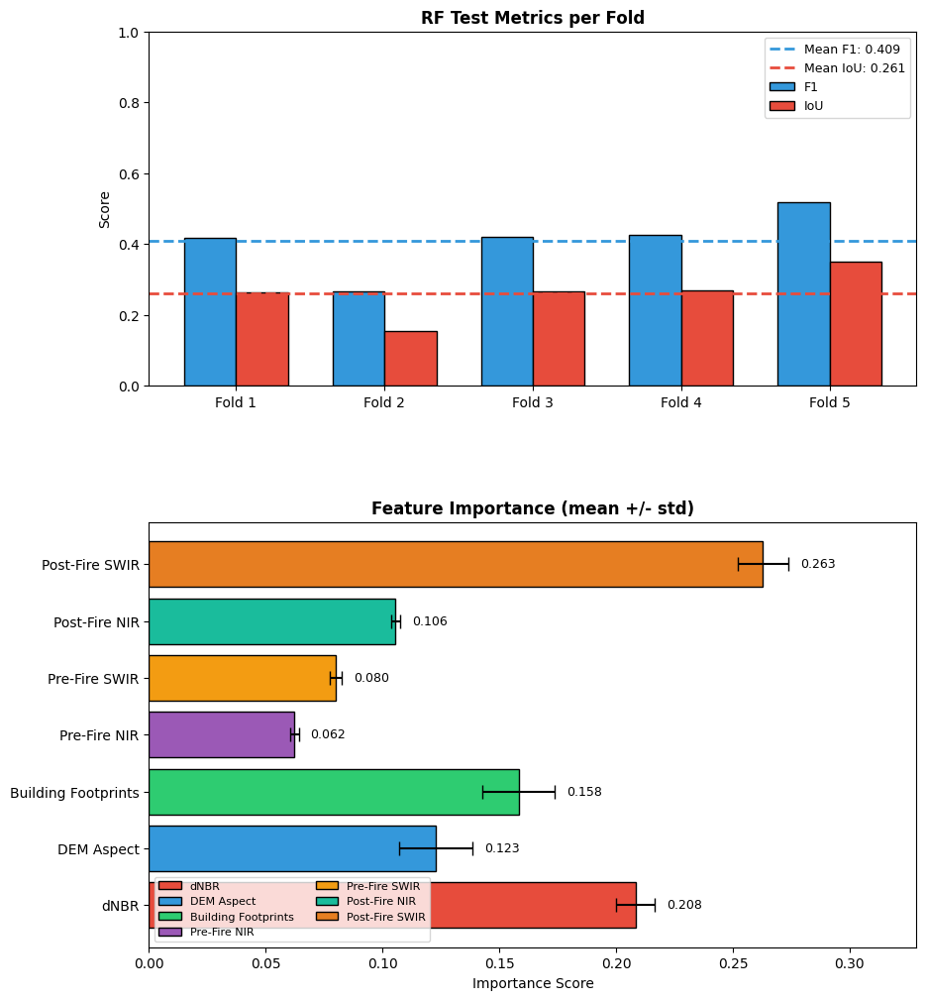

In [66]:
# AGGREGATE AND VISUALIZE RANDOM FOREST RESULTS
rf_f1_mean = np.mean(rf_fold_results["f1_test"])
rf_f1_std = np.std(rf_fold_results["f1_test"])
rf_iou_mean = np.mean(rf_fold_results["iou_test"])
rf_iou_std = np.std(rf_fold_results["iou_test"])
rf_fi_mean = np.mean(rf_fold_results["feature_importance"], axis = 0)
rf_fi_std = np.std(rf_fold_results["feature_importance"], axis = 0)

print("RANDOM FOREST TEST METRICS (mean +/- std)")
print(f"  F1 Score: {rf_f1_mean:.4f} +/- {rf_f1_std:.4f}")
print(f"  IoU:      {rf_iou_mean:.4f} +/- {rf_iou_std:.4f}")

fig = plt.figure(figsize = (10, 12))
gs = fig.add_gridspec(2, 1, height_ratios = [1, 1.2], hspace = 0.35)
axes = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[1, 0])]

# Per-fold metrics.
x_pos = np.arange(n_folds)
w = 0.35
axes[0].bar(x_pos - w/2, rf_fold_results["f1_test"], w, label = "F1", color = "#3498DB", edgecolor = "black")
axes[0].bar(x_pos + w/2, rf_fold_results["iou_test"], w, label = "IoU", color = "#E74C3C", edgecolor = "black")
axes[0].axhline(y = rf_f1_mean, color = "#3498DB", linestyle = "--", lw = 2, label = f"Mean F1: {rf_f1_mean:.3f}")
axes[0].axhline(y = rf_iou_mean, color = "#E74C3C", linestyle = "--", lw = 2, label = f"Mean IoU: {rf_iou_mean:.3f}")
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels([f"Fold {i+1}" for i in range(n_folds)])
axes[0].set_ylabel("Score")
axes[0].set_title("RF Test Metrics per Fold", fontweight = "bold")
axes[0].legend(loc = "upper right", fontsize = 9)
axes[0].set_ylim(0, 1)

# Feature importance.
colors = ["#E74C3C", "#3498DB", "#2ECC71", "#9B59B6", "#F39C12", "#1ABC9C", "#E67E22", "#34495E"]
bars = axes[1].barh(channel_names, rf_fi_mean, xerr = rf_fi_std, color = colors, edgecolor = "black", capsize = 5)
axes[1].set_xlabel("Importance Score")
axes[1].set_title("Feature Importance (mean +/- std)", fontweight = "bold")
for idx_fi, (m, s) in enumerate(zip(rf_fi_mean, rf_fi_std)):
    axes[1].text(m + s + 0.005, idx_fi, f"{m:.3f}", va = "center", fontsize = 9)

# Add legend for colors
legend_elements = [Patch(facecolor = colors[i], edgecolor = "black", label = channel_names[i]) for i in range(len(channel_names))]
axes[1].legend(handles = legend_elements, loc = "lower left", fontsize = 8, ncol = 2)

# Set explicit x-axis limit with margin for error bars and text
axes[1].set_xlim(0, max(rf_fi_mean + rf_fi_std) * 1.2)

plt.savefig(images_path / "rf_fold_metrics.png", dpi = 300, bbox_inches = "tight")
plt.show()

### Primary Model: Topographically Aware U-Net

The primary model is a U-Net semantic segmentation architecture adapted for the structural damage classification task. Unlike the Random Forest baseline, which classifies each pixel independently, the U-Net operates on 64 by 64 pixel patches and learns spatial patterns across neighboring pixels through convolutional filters and an encoder-decoder structure with skip connections.

**Architecture Details**

The encoder path consists of three downsampling stages with max-pooling, using convolutional blocks of 32, 64, and 128 filters respectively. A 256-filter bottleneck captures the highest-level abstract features. The decoder mirrors the encoder with transposed convolution upsampling and skip connections from the corresponding encoder stage. Each convolutional block applies two 3 by 3 convolutions with batch normalization, ReLU activation, standard dropout, and spatial dropout (SpatialDropout2D). Spatial dropout drops entire feature maps rather than individual activations, providing stronger regularization for spatially correlated satellite imagery. Dropout rates increase with depth (0.1 at the first stage to 0.3 at the bottleneck). The output head produces a single-channel sigmoid activation cast to float32 under mixed-precision training to run faster.

**Loss Function**

A combined loss function equally weights Dice loss and Binary Focal Cross-Entropy. Dice loss directly optimizes the F1/Dice coefficient, making it well-suited for class-imbalanced segmentation. Focal loss (`alpha = 0.80`, `gamma = 3.0`) down-weights easily classified intact pixels and concentrates the gradient on hard examples near the decision boundary, with the alpha parameter further emphasizing the minority damaged class.

**Training Process**

Models are trained for up to 50 epochs with early stopping (`patience = 10`, monitoring validation loss) and learning rate reduction on plateau (`patience = 5`, `factor = 0.5`). The Adam optimizer is used with a learning rate scaled linearly with batch size (1e-3 by batch_size/8). Data augmentation applies random horizontal flips, vertical flips, and 90-degree rotations, which are all geometrically valid for nadir satellite imagery that has no canonical orientation. Feature standardization is fit on training patches only and applied to validation and test sets to prevent information leakage.

**Threshold Tuning**

After training, an optimal classification threshold is selected by sweeping candidate values from 0.1 to 0.7 on validation set predictions. The threshold maximizing validation F1 is then applied to the held-out test set. Both fixed-threshold (0.5) and tuned-threshold results are reported to distinguish honest generalization performance from operational utility.

In [54]:
# Enable mixed precision globally before any model is constructed.
mixed_precision.set_global_policy("mixed_float16")

In [55]:
# LOSS FUNCTIONS AND METRICS
def dice_loss(y_true, y_pred, smooth = 1e-6):
    # Flatten tensors to compute overlap across all spatial positions.
    y_true_flat = K.flatten(K.cast(y_true, "float32"))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat)
    # Return the Dice loss, where 1.0 is worst and 0.0 is perfect overlap.
    return 1.0 - (2.0 * intersection + smooth) / (union + smooth)

# Alpha of 0.80 heavily weights the minority damaged class at ~5.8% prevalence.
# Gamma of 3.0 more aggressively down-weights easy negatives than the default of 2.0.
focal_loss_fn = BinaryFocalCrossentropy(
    apply_class_balancing = True, alpha = 0.80, gamma = 3.0, from_logits = False,
)

def combined_loss(y_true, y_pred, dice_weight = 0.5, focal_weight = 0.5):
    # Combine Dice and Focal losses with equal weighting.
    return dice_weight * dice_loss(y_true, y_pred) + focal_weight * focal_loss_fn(y_true, y_pred)

def dice_coef_metric(y_true, y_pred, smooth = 1e-6):
    # Compute the Dice coefficient as a training-time monitoring metric.
    y_true_flat = K.flatten(K.cast(y_true, "float32"))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat)
    return (2.0 * intersection + smooth) / (union + smooth)

def find_optimal_threshold(y_true_flat, y_pred_proba_flat):
    # Sweep candidate thresholds and select the one maximizing binary F1.
    thresholds = np.linspace(0.1, 0.7, 61)
    f1_scores = [
        f1_score(
            y_true_flat,
            (y_pred_proba_flat > t).astype(np.uint8),
            average = "binary",
            zero_division = 0,
        )
        for t in thresholds
    ]
    optimal_threshold = thresholds[np.argmax(f1_scores)]
    return optimal_threshold, float(max(f1_scores))

In [56]:
# U-NET ARCHITECTURE
def conv_block(inputs, filters, kernel_size = 3, dropout_rate = 0.1, spatial_dropout_rate = 0.1):
    # Apply two sequential convolutions with batch normalization and ReLU activation.
    x = Conv2D(filters, kernel_size, padding = "same", kernel_initializer = "he_normal")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(filters, kernel_size, padding = "same", kernel_initializer = "he_normal")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    # Apply standard dropout to individual activations.
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    # Apply spatial dropout to entire feature maps for stronger regularization.
    if spatial_dropout_rate > 0:
        x = SpatialDropout2D(spatial_dropout_rate)(x)
    return x

def build_unet_64(input_shape = (64, 64, 7), num_classes = 1, base_filters = 32):
    inputs = Input(shape = input_shape)

    # ENCODER PATH
    enc1 = conv_block(inputs, base_filters, dropout_rate = 0.1, spatial_dropout_rate = 0.1)
    pool1 = MaxPooling2D(pool_size = (2, 2))(enc1)
    enc2 = conv_block(pool1, base_filters * 2, dropout_rate = 0.1, spatial_dropout_rate = 0.1)
    pool2 = MaxPooling2D(pool_size = (2, 2))(enc2)
    enc3 = conv_block(pool2, base_filters * 4, dropout_rate = 0.2, spatial_dropout_rate = 0.15)
    pool3 = MaxPooling2D(pool_size = (2, 2))(enc3)

    # BOTTLENECK
    bottleneck = conv_block(pool3, base_filters * 8, dropout_rate = 0.3, spatial_dropout_rate = 0.2)

    # DECODER PATH
    up3 = Conv2DTranspose(base_filters * 4, (2, 2), strides = (2, 2), padding = "same")(bottleneck)
    up3 = concatenate([up3, enc3])
    dec3 = conv_block(up3, base_filters * 4, dropout_rate = 0.2, spatial_dropout_rate = 0.15)
    up2 = Conv2DTranspose(base_filters * 2, (2, 2), strides = (2, 2), padding = "same")(dec3)
    up2 = concatenate([up2, enc2])
    dec2 = conv_block(up2, base_filters * 2, dropout_rate = 0.1, spatial_dropout_rate = 0.1)
    up1 = Conv2DTranspose(base_filters, (2, 2), strides = (2, 2), padding = "same")(dec2)
    up1 = concatenate([up1, enc1])
    dec1 = conv_block(up1, base_filters, dropout_rate = 0.1, spatial_dropout_rate = 0.1)

    # OUTPUT HEAD — cast to float32 required under mixed precision.
    outputs = Conv2D(num_classes, (1, 1), activation = "linear")(dec1)
    outputs = Activation("sigmoid", dtype = "float32", name = "sigmoid_float32")(outputs)
    return Model(inputs = inputs, outputs = outputs, name = "TopographicallyAwareUNet_64")

# VERIFY ARCHITECTURE
test_model = build_unet_64(input_shape = (64, 64, channels))
test_model.summary()
del test_model

Model: "TopographicallyAwareUNet_64"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 64, 64, 7) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 64, 64,    │      2,048 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        128 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_14       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 64, 64,    │      9,248 │ activation_14[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        128 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_15       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 64, 64,    │          0 │ activation_15[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout2d_7 │ (None, 64, 64,    │          0 │ dropout_7[0][0]   │
│ (SpatialDropout2D)  │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 32, 32,    │          0 │ spatial_dropout2… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 32, 32,    │     18,496 │ max_pooling2d_3[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_17[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_16       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 32, 32,    │     36,928 │ activation_16[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_17       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 32, 32,    │          0 │ activation_17[0]

 Total params: 1,932,385 (7.37 MB)

 Trainable params: 1,929,569 (7.36 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [57]:
# AUGMENTATION FUNCTION
def augment(x, y):
    # Apply a random left-right flip identically to the patch and its label mask.
    flip_lr = tf.random.uniform([], 0, 1.0, dtype = tf.float32) > 0.5
    x = tf.cond(flip_lr, lambda: tf.image.flip_left_right(x), lambda: x)
    y = tf.cond(flip_lr, lambda: tf.image.flip_left_right(y), lambda: y)

    # Apply a random up-down flip identically to the patch and its label mask.
    flip_ud = tf.random.uniform([], 0, 1.0, dtype = tf.float32) > 0.5
    x = tf.cond(flip_ud, lambda: tf.image.flip_up_down(x), lambda: x)
    y = tf.cond(flip_ud, lambda: tf.image.flip_up_down(y), lambda: y)

    # Apply a random 90-degree rotation (0, 90, 180, or 270 degrees).
    # Nadir satellite imagery has no canonical orientation, so all rotations are valid.
    k = tf.random.uniform([], minval = 0, maxval = 4, dtype = tf.int32)
    x = tf.image.rot90(x, k = k)
    y = tf.image.rot90(y, k = k)

    return x, y

### U-Net K-Fold Cross-Validation

In [59]:
# U-NET K-FOLD TRAINING
unet_fold_results = {
    "f1_test": [],
    "f1_test_tuned": [],
    "iou_test": [],
    "f1_val": [],
    "best_val_dice": [],
    "epochs_trained": [],
    "optimal_threshold": [],
}

best_overall_val_f1 = -1.0

model_file = model_path / "unet_best_model.keras"

if not model_file.exists():
    for fold in range(n_folds):
        print(f"\nFOLD {fold + 1}/{n_folds}")

        X_train, y_train, X_val, y_val, X_test, y_test = extract_fold_patches_multifire(
            fire_data, fire_block_data, block_to_fold, fold, patch_size, n_folds,
        )
        print(f"Train: {X_train.shape[0]}, Val: {X_val.shape[0]}, Test: {X_test.shape[0]}")

        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            print("SKIPPED: insufficient data.")
            for key in unet_fold_results:
                unet_fold_results[key].append(np.nan)
            continue

        # Fit the scaler on training patches only and apply to val and test.
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train.reshape(-1, channels)).reshape(X_train.shape)
        X_val = scaler.transform(X_val.reshape(-1, channels)).reshape(X_val.shape)
        X_test = scaler.transform(X_test.reshape(-1, channels)).reshape(X_test.shape)

        # Build tf.data pipelines, applying augmentation only to the training split.
        batch_size = 16
        train_dataset = (
            tf.data.Dataset.from_tensor_slices((X_train, y_train))
            .shuffle(buffer_size = 1024)
            .map(augment, num_parallel_calls = tf.data.AUTOTUNE)
            .batch(batch_size)
            .prefetch(tf.data.AUTOTUNE)
        )
        val_dataset = (
            tf.data.Dataset.from_tensor_slices((X_val, y_val))
            .batch(batch_size)
            .prefetch(tf.data.AUTOTUNE)
        )

        tf.keras.backend.clear_session()
        tf.random.set_seed(random_seed)

        fold_iou = BinaryIoU(target_class_ids = [1], threshold = 0.5, name = "iou_metric")
        model = build_unet_64(input_shape = (patch_size, patch_size, channels))

        # Scale learning rate linearly with batch size relative to the original batch of 8.
        scaled_lr = 1e-3 * (batch_size / 8)

        model.compile(
            optimizer = Adam(learning_rate = scaled_lr),
            loss = combined_loss,
            metrics = [dice_coef_metric, fold_iou],
        )

        callbacks = [
            EarlyStopping(
                monitor = "val_loss",
                patience = 10,
                min_delta = 1e-3,
                restore_best_weights = True,
                verbose = 1,
            ),
            ReduceLROnPlateau(
                monitor = "val_loss",
                patience = 5,
                factor = 0.5,
                min_delta = 1e-3,
                min_lr = 1e-6,
                verbose = 1,
            ),
        ]

        history = model.fit(
            train_dataset,
            validation_data = val_dataset,
            epochs = 50,
            callbacks = callbacks,
            verbose = 1,
        )

        # THRESHOLD SELECTION ON VALIDATION SET
        # Threshold is tuned on validation predictions and then applied to the test set.
        y_pred_proba_val = model.predict(X_val, verbose = 0).flatten()
        y_pred_proba_test = model.predict(X_test, verbose = 0).flatten()

        optimal_thresh, val_f1_at_thresh = find_optimal_threshold(y_val.flatten(), y_pred_proba_val)
        print(f"Optimal threshold: {optimal_thresh:.2f} | Val F1 at threshold: {val_f1_at_thresh:.4f}")

        # Fixed threshold evaluation reflects honest generalization performance.
        y_pred_fixed = (y_pred_proba_test > 0.5).astype(np.uint8)
        f1_test = f1_score(y_test.flatten(), y_pred_fixed, average = "binary", zero_division = 0)
        iou_test = jaccard_score(y_test.flatten(), y_pred_fixed, average = "binary", zero_division = 0)

        # Tuned threshold evaluation reflects operational utility at deployment.
        y_pred_tuned = (y_pred_proba_test > optimal_thresh).astype(np.uint8)
        f1_test_tuned = f1_score(y_test.flatten(), y_pred_tuned, average = "binary", zero_division = 0)

        f1_val = f1_score(
            y_val.flatten(),
            (y_pred_proba_val > 0.5).astype(np.uint8),
            average = "binary",
            zero_division = 0,
        )
        best_val_dice = max(history.history.get("val_dice_coef_metric", [0]))
        epochs_trained = len(history.history["loss"])

        unet_fold_results["f1_test"].append(f1_test)
        unet_fold_results["f1_test_tuned"].append(f1_test_tuned)
        unet_fold_results["iou_test"].append(iou_test)
        unet_fold_results["f1_val"].append(f1_val)
        unet_fold_results["best_val_dice"].append(best_val_dice)
        unet_fold_results["epochs_trained"].append(epochs_trained)
        unet_fold_results["optimal_threshold"].append(optimal_thresh)

        print(f"Test F1 (0.5): {f1_test:.4f} | Test F1 (tuned): {f1_test_tuned:.4f} | IoU: {iou_test:.4f} | Val Dice: {best_val_dice:.4f} | Epochs: {epochs_trained}")

        # Save the best model across folds based on Validation F1 score.
        if f1_val > best_overall_val_f1:
            best_overall_val_f1 = f1_val
            model.save(model_file)
            print(f"Saved new best model (Val F1: {best_overall_val_f1:.4f})")
else:
    print(f"Found existing model at {model_file}. Skipping training.")


FOLD 1/5
Train: 174, Val: 23, Test: 24
Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 51s 3s/step - dice_coef_metric: 0.1346 - iou_metric: 0.0990 - loss: 0.4612 - val_dice_coef_metric: 0.1660 - val_iou_metric: 0.0736 - val_loss: 341.7978 - learning_rate: 0.0020
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - dice_coef_metric: 0.1942 - iou_metric: 0.2337 - loss: 0.4228 - val_dice_coef_metric: 0.1656 - val_iou_metric: 0.0734 - val_loss: 414.7520 - learning_rate: 0.0020
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - dice_coef_metric: 0.2223 - iou_metric: 0.2712 - loss: 0.4027 - val_dice_coef_metric: 0.1657 - val_iou_metric: 0.0735 - val_loss: 99.4219 - learning_rate: 0.0020
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - dice_coef_metric: 0.2591 - iou_metric: 0.2947 - loss: 0.3862 - val_dice_coef_metric: 0.1829 - val_iou_metric: 0.0919 - val_loss: 5.6015 - learning_rate: 0.0020
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - dice_coef_metric: 0.3137 - iou_metric: 0.3507 - loss: 0

Optimal threshold: 0.49 | Val F1 at threshold: 0.7213
Test F1 (0.5): 0.6102 | Test F1 (tuned): 0.6103 | IoU: 0.4391 | Val Dice: 0.6864 | Epochs: 33
Saved new best model (Val F1: 0.7202)

FOLD 3/5
Train: 158, Val: 27, Test: 26
Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - dice_coef_metric: 0.1931 - iou_metric: 0.1546 - loss: 0.4275 - val_dice_coef_metric: 0.0434 - val_iou_metric: 0.0212 - val_loss: 32.2532 - learning_rate: 0.0020
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - dice_coef_metric: 0.2929 - iou_metric: 0.3087 - loss: 0.3797 - val_dice_coef_metric: 0.0566 - val_iou_metric: 0.0269 - val_loss: 5.7923 - learning_rate: 0.0020
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - dice_coef_metric: 0.3732 - iou_metric: 0.3972 - loss: 0.3349 - val_dice_coef_metric: 0.0510 - val_iou_metric: 0.0249 - val_loss: 1.8294 - learning_rate: 0.0020
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - dice_coef_metric: 0.3872 - iou_metric: 0.4043 - loss: 0.3279 - val_dice_coef_metric: 

U-NET RESULTS (mean +/- std)
F1 Score: 0.6537 +/- 0.0488
IoU: 0.4875 +/- 0.0542


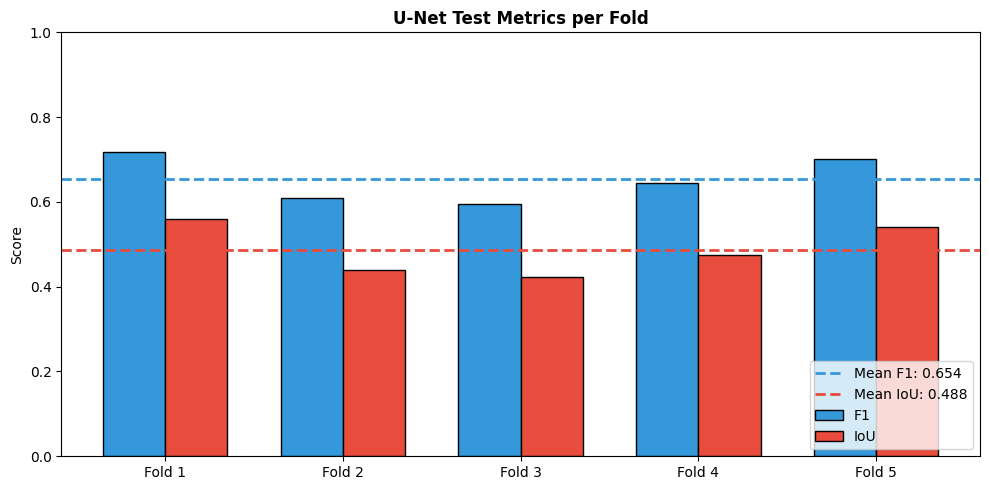

In [60]:
# AGGREGATE AND VISUALIZE U-NET RESULTS
valid_f1 = [x for x in unet_fold_results["f1_test"] if not np.isnan(x)]
valid_iou = [x for x in unet_fold_results["iou_test"] if not np.isnan(x)]

unet_f1_mean = np.mean(valid_f1) if valid_f1 else 0
unet_f1_std = np.std(valid_f1) if valid_f1 else 0
unet_iou_mean = np.mean(valid_iou) if valid_iou else 0
unet_iou_std = np.std(valid_iou) if valid_iou else 0

print("U-NET RESULTS (mean +/- std)")
print(f"F1 Score: {unet_f1_mean:.4f} +/- {unet_f1_std:.4f}")
print(f"IoU: {unet_iou_mean:.4f} +/- {unet_iou_std:.4f}")

fig, ax = plt.subplots(figsize = (10, 5))
x_pos = np.arange(n_folds)
w = 0.35
f1_vals = [x if not np.isnan(x) else 0 for x in unet_fold_results["f1_test"]]
iou_vals = [x if not np.isnan(x) else 0 for x in unet_fold_results["iou_test"]]

ax.bar(x_pos - w/2, f1_vals, w, label = "F1", color = "#3498DB", edgecolor = "black")
ax.bar(x_pos + w/2, iou_vals, w, label = "IoU", color = "#E74C3C", edgecolor = "black")
ax.axhline(y = unet_f1_mean, color = "#3498DB", linestyle = "--", lw = 2, label = f"Mean F1: {unet_f1_mean:.3f}")
ax.axhline(y = unet_iou_mean, color = "#E74C3C", linestyle = "--", lw = 2, label = f"Mean IoU: {unet_iou_mean:.3f}")
ax.set_xticks(x_pos)
ax.set_xticklabels([f"Fold {i+1}" for i in range(n_folds)])
ax.set_ylabel("Score")
ax.set_title("U-Net Test Metrics per Fold", fontweight = "bold")
ax.legend(loc = "lower right")
ax.set_ylim(0, 1)
plt.tight_layout()
plt.savefig(images_path / "unet_fold_metrics.png", dpi = 300, bbox_inches = "tight")
plt.show()

## Evaluation & Analysis

This section reports model performance, compares the baseline and primary models, and discusses successes, failures, and limitations.

**Metrics:** All results are reported as 5-fold spatial block cross-validation averages (mean ± standard deviation) for both F1-Score (Dice Coefficient) and Intersection over Union (IoU), computed on the positive (damaged) class only. These metrics are appropriate for the severe class imbalance (~5.8% positive prevalence) because they ignore true negatives, which would inflate accuracy-based metrics.

**Baseline vs. Primary Model Comparison:**

The Random Forest baseline establishes that pixel-level spectral and topographic features alone contain meaningful signal for damage prediction, so the U-Net builds on this by incorporating spatial context through convolutional filters, and the comparison reveals whether the added architectural complexity of a deep learning model is justified for this task and dataset size.

**Model Positives:** The U-Net successfully identifies concentrated damage clusters where multiple adjacent structures were destroyed, particularly in areas with strong dNBR signal and clear pre-to-post spectral change. The spatial context from convolutional filters helps the model produce more spatially coherent predictions compared to the salt-and-pepper noise pattern typical of pixel-wise Random Forest classification.

**Model Negatives:** Performance is weakest at damage boundaries and for isolated damaged structures surrounded by intact pixels. The 20m Sentinel-2 resolution means that individual structures occupy only one or a few pixels, and sub-pixel mixing between damaged and undamaged surfaces dilutes the spectral signal. The model also struggles in areas where topographic shadow or vegetation regrowth obscures the burn scar signature.

**Limitations:**

- *Small dataset size* where even with both fires combined, the training set contains a limited number of 64 by 64 patches with positive-class pixels. This produces high fold-to-fold variance in test metrics, meaning that architecture-level improvements are difficult to distinguish from random seed effects. The standard deviation across folds is a direct consequence of having only 13-20 test patches per fold.
- *Resolution constraint* where Sentinel-2's 20m pixels struggles to resolve individual structures, so the model is effectively learning coarser-level damage patterns. In this regard, commercial sensors would dramatically improve spatial precision for future work.
- *Ground truth completeness* is an issue as DINS field assessments may not cover every damaged structure, particularly in areas with limited road access during the early post-fire period. Any unlabeled damaged structures are treated as negative examples during training, which biases the model toward under-predicting damage.
- *Temporal generalizability* cannot be extrapolated as the model is trained on a single fire event (January 2025), so generalization to fires in different vegetation types, climate zones, or seasons has not been tested.

In [61]:
# MODEL COMPARISON SUMMARY
f1_diff = unet_f1_mean - rf_f1_mean
iou_diff = unet_iou_mean - rf_iou_mean

print("MODEL COMPARISON (5-FOLD SPATIAL CV, PALISADES + EATON)")
print("\nRandom Forest Baseline")
print(f"F1: {rf_f1_mean:.4f} +/- {rf_f1_std:.4f}")
print(f"IoU: {rf_iou_mean:.4f} +/- {rf_iou_std:.4f}")
print("\nU-Net Primary Model")
print(f"F1: {unet_f1_mean:.4f} +/- {unet_f1_std:.4f}")
print(f"IoU: {unet_iou_mean:.4f} +/- {unet_iou_std:.4f}")
print("\nDifference (U-Net - RF)")
print(f"F1: {f1_diff:+.4f}")
print(f"IoU: {iou_diff:+.4f}")

if unet_f1_mean >= 0.70:
    print("\nSTATUS: Operational utility threshold reached (F1 >= 0.70).")
elif unet_f1_mean >= 0.50:
    print("\nSTATUS: Predictive signal confirmed (F1 >= 0.50), below operational utility.")
else:
    print("\nSTATUS: Below predictive signal threshold (F1 < 0.50).")

print("\nRF FEATURE IMPORTANCE")
for idx_fi, name in enumerate(channel_names):
    print(f"{name}: {rf_fi_mean[idx_fi]:.4f} +/- {rf_fi_std[idx_fi]:.4f}")

MODEL COMPARISON (5-FOLD SPATIAL CV, PALISADES + EATON)

Random Forest Baseline
F1: 0.4095 +/- 0.0814
IoU: 0.2607 +/- 0.0629

U-Net Primary Model
F1: 0.6537 +/- 0.0488
IoU: 0.4875 +/- 0.0542

Difference (U-Net - RF)
F1: +0.2442
IoU: +0.2268

STATUS: Predictive signal confirmed (F1 >= 0.50), below operational utility.

RF FEATURE IMPORTANCE
dNBR: 0.2082 +/- 0.0083
DEM Aspect: 0.1228 +/- 0.0157
Building Footprints: 0.1583 +/- 0.0156
Pre-Fire NIR: 0.0622 +/- 0.0019
Pre-Fire SWIR: 0.0799 +/- 0.0026
Post-Fire NIR: 0.1056 +/- 0.0019
Post-Fire SWIR: 0.2629 +/- 0.0109


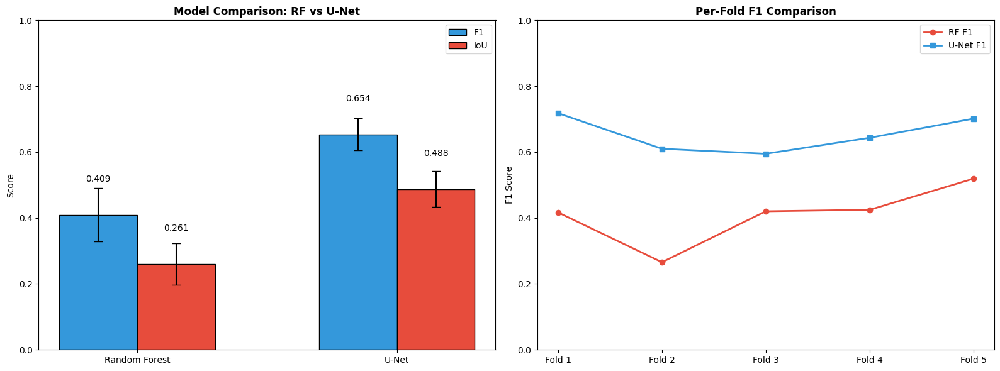

In [62]:
# MODEL COMPARISON BAR CHART
fig, axes = plt.subplots(1, 2, figsize = (16, 6))

# Grouped bar chart.
models = ["Random Forest", "U-Net"]
f1_means = [rf_f1_mean, unet_f1_mean]
f1_stds = [rf_f1_std, unet_f1_std]
iou_means = [rf_iou_mean, unet_iou_mean]
iou_stds = [rf_iou_std, unet_iou_std]

x_pos = np.arange(len(models))
w = 0.3
b1 = axes[0].bar(x_pos - w/2, f1_means, w, yerr = f1_stds, label = "F1", color = "#3498DB", edgecolor = "black", capsize = 5)
b2 = axes[0].bar(x_pos + w/2, iou_means, w, yerr = iou_stds, label = "IoU", color = "#E74C3C", edgecolor = "black", capsize = 5)
for bg in [b1, b2]:
    for bar in bg:
        h = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2, h + 0.1, f"{h:.3f}", ha = "center", fontsize = 10)
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(models)
axes[0].set_ylabel("Score")
axes[0].set_title("Model Comparison: RF vs U-Net", fontweight = "bold")
axes[0].legend()
axes[0].set_ylim(0, 1)

# Per-fold comparison.
x_pos2 = np.arange(n_folds)
axes[1].plot(x_pos2, rf_fold_results["f1_test"], "o-", label = "RF F1", color = "#E74C3C", lw = 2)
axes[1].plot(x_pos2, unet_fold_results["f1_test"], "s-", label = "U-Net F1", color = "#3498DB", lw = 2)
axes[1].set_xticks(x_pos2)
axes[1].set_xticklabels([f"Fold {i+1}" for i in range(n_folds)])
axes[1].set_ylabel("F1 Score")
axes[1].set_title("Per-Fold F1 Comparison", fontweight = "bold")
axes[1].legend()
axes[1].set_ylim(0, 1)

plt.tight_layout()
plt.savefig(images_path / "model_comparison.png", dpi = 300, bbox_inches = "tight")
plt.show()

In [63]:
# PER-FOLD DETAIL TABLE
print("PER-FOLD TEST F1 SCORES")
print(f"{'Fold':<8} {'RF F1':>10} {'U-Net F1':>10} {'Diff':>10}")
for fold in range(n_folds):
    rf_f1 = rf_fold_results["f1_test"][fold]
    unet_f1 = unet_fold_results["f1_test"][fold]
    diff = unet_f1 - rf_f1 if not np.isnan(unet_f1) else float("nan")
    print(f"Fold {fold + 1:<3} {rf_f1:>10.4f} {unet_f1:>10.4f} {diff:>+10.4f}")

PER-FOLD TEST F1 SCORES
Fold          RF F1   U-Net F1       Diff
Fold 1       0.4168     0.7181    +0.3013
Fold 2       0.2658     0.6102    +0.3444
Fold 3       0.4204     0.5950    +0.1746
Fold 4       0.4250     0.6436    +0.2186
Fold 5       0.5194     0.7016    +0.1822


## Future Work

Several directions would improve this pipeline given additional time and resources.

**Higher-Resolution Imagery**

The most impactful improvement would be incorporating sub-meter commercial imagery. WorldView-3 provides both high spatial resolution (0.3m panchromatic, 1.2m multispectral) and SWIR bands (3.7m), which would allow building-level damage classification rather than neighborhood-level patterns. Planet SuperDove imagery (3m, daily revisit) could serve as an intermediate step, though it lacks SWIR coverage.

**Expanded Training Data**

Processing additional fire events beyond Palisades and Eaton (such as the 2018 Camp Fire or 2020 Glass Fire) would increase the training set and test generalization across different vegetation types, urban densities, and topographic settings. The preprocessing pipeline is already parameterized to accept arbitrary fire configurations, so adding new events requires only new vector data files and bounding box coordinates.

**Architectural Refinements**

Attention gates in the skip connections could help the model focus on damage-relevant features at each decoder stage, and residual connections within the convolutional blocks could improve gradient flow in deeper variants. These were explored in earlier iterations and showed modest improvements, but the small dataset size made the gains difficult to distinguish from variance.

**Operational Deployment**

For real-world use, the pipeline could be wrapped in a cloud-based service that triggers automatically when new post-fire Sentinel-2 scenes become available over a monitored region. A confidence-calibrated output (probability map rather than binary mask) would give emergency managers more actionable information than a hard classification, allowing them to prioritize inspection of high-probability damage zones while the DINS field teams are still being mobilized.

## AI Use

Claude Haiku 4.5 (free tier) was used for debugging Python code and assisting with function definitions. All model design choices, data pipeline logic, and written analysis were developed by the project team.